# Head

In [1]:
import os
# os.environ['cuda_visible_devices'] = '1'
import sys
import torch
import torch.nn as nn
import torch.utils.data as data
from torch.utils.data import DataLoader
from torch.nn import functional as F
from torchvision import models
from pytorch3d.loss import chamfer_distance
import scipy.signal as sg
from sklearn.cluster import KMeans
import pandas as pd
# import pytorch3d
import cv2
import numpy as np
from PIL import Image
import glob
import json
import itertools
from tqdm import tqdm
from tqdm import trange
from copy import deepcopy
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import f1_score
from sklearn.cluster import KMeans
import shutil
from matplotlib import pyplot as plt
from misc import panostretch
from shapely.geometry import LineString
from transformations_torch import *
from dataset import *
from model import HorizonNet, DoorNet
from grid import warp_index, compute_global, compute_local, guess_ceiling
from misc import post_proc, panostretch, utils
from inference import inference
from eval_general import test_general

In [4]:
ann_list = glob.glob(os.path.join('/mnt/home_6T/sunset/zind/0377/label_cor_noocc', 'floor_01_partial_room_16*.json'))
imgs, anns, txts = [], [], []
for ann_path in ann_list:
    dirname, basename = os.path.split(ann_path)
    basename = basename.split('.')[0]
    scene_dir = os.path.dirname(dirname)
    img_path = os.path.join(scene_dir, 'panos', f'{basename}.jpg')
    txt_path = f'{ann_path.split(".")[0]}.txt'
    imgs.append(torch.FloatTensor(np.array(Image.open(img_path).resize((1024, 512))).transpose([2, 0, 1])) / 255.)
    with open(ann_path) as f: anns.append(json.load(f))
    txts.append(np.loadtxt(txt_path, delimiter=' '))

In [3]:
class ZillowIndoorPairDataset(data.Dataset):
    def __init__(self, root_dir, subject,
                 flip=False, rotate=False, gamma=False, stretch=False,
                 p_base=0.96, max_stretch=2.0,
                 normcor=False, return_cor=False, return_path=False):

        assert subject in ['train', 'val', 'test'], root_dir
        with open(os.path.join(root_dir, 'zind_partition.json')) as f: split_data = json.load(f)
        scene_ids = split_data[subject]
        all_txts = []
        for scene_id in scene_ids:
            scene_dir = os.path.join(root_dir, scene_id)
            all_txts += glob.glob(os.path.join(scene_dir, 'label_cor_noocc', '*.json'))
            
        all_scenes = {}
        for filename in all_txts:
            partial_room_id, pano_id = filename.split('_pano_')
            if partial_room_id in all_scenes:
                all_scenes[partial_room_id].append(pano_id)
            else:
                all_scenes[partial_room_id] = [pano_id]
        
        self.scenes = []
        for k, v in all_scenes.items():
            if len(v) >= 2:
                file_pair = (f'{k}_pano_{v[0]}', f'{k}_pano_{v[1]}')
                self.scenes.append(file_pair)
                
                
        self.flip = flip
        self.rotate = rotate
        self.gamma = gamma
        self.stretch = stretch
        self.p_base = p_base
        self.max_stretch = max_stretch
        self.normcor = normcor
        self.return_cor = return_cor
        self.return_path = return_path       
        
            

    def _check_dataset(self):
        for fname in self.txt_fnames:
            assert os.path.isfile(os.path.join(self.cor_dir, fname)),\
                '%s not found' % os.path.join(self.cor_dir, fname)

    def __len__(self):
        return len(self.scenes)

    def __getitem__(self, idx):
        view_path, proj_path = self.scenes[idx]
        
        label_path = view_path
        dirname, basename = os.path.split(label_path)
        basename = basename.split('.')[0]
        scene_dir = os.path.dirname(dirname)
        img_path = os.path.join(scene_dir, 'panos', f'{basename}.jpg')
        with open(label_path) as f: view_ann = json.load(f)
        view_img = np.array(Image.open(img_path).resize((1024, 512)), np.float32)[..., :3] / 255.
        
        label_path = proj_path
        dirname, basename = os.path.split(label_path)
        basename = basename.split('.')[0]
        scene_dir = os.path.dirname(dirname)
        img_path = os.path.join(scene_dir, 'panos', f'{basename}.jpg')
        with open(label_path) as f: proj_ann = json.load(f)
        proj_img = np.array(Image.open(img_path).resize((1024, 512)), np.float32)[..., :3] / 255.
        
        view_transformer = Transformation2D.from_zind_data(view_ann['floor_plan_transformation'])
        proj_transformer = Transformation2D.from_zind_data(proj_ann['floor_plan_transformation'])
        
        H, W = view_img.shape[:2]


        # Stretch augmentation
        if self.stretch:
            xmin, ymin, xmax, ymax = cor2xybound(cor)
            kx = np.random.uniform(1.0, self.max_stretch)
            ky = np.random.uniform(1.0, self.max_stretch)
            if np.random.randint(2) == 0:
                kx = max(1 / kx, min(0.5 / xmin, 1.0))
            else:
                kx = min(kx, max(10.0 / xmax, 1.0))
            if np.random.randint(2) == 0:
                ky = max(1 / ky, min(0.5 / ymin, 1.0))
            else:
                ky = min(ky, max(10.0 / ymax, 1.0))
            img, cor = panostretch.pano_stretch(img, cor, kx, ky)

        # Prepare 1d ceiling-wall/floor-wall boundary
        # bon = cor_2_1d(cor, H, W)

        # Random flip
        if self.flip and np.random.randint(2) == 0:
            img = np.flip(img, axis=1)
            bon = np.flip(bon, axis=1)
            cor[:, 0] = img.shape[1] - 1 - cor[:, 0]

        # Random horizontal rotate
        if self.rotate:
            dx = np.random.randint(img.shape[1])
            img = np.roll(img, dx, axis=1)
            bon = np.roll(bon, dx, axis=1)
            cor[:, 0] = (cor[:, 0] + dx) % img.shape[1]

        # Random gamma augmentation
        if self.gamma:
            p = np.random.uniform(1, 2)
            if np.random.randint(2) == 0:
                p = 1 / p
            img = img ** p

        # Convert all data to tensor
        view_img = torch.FloatTensor(view_img.transpose([2, 0, 1]).copy())
        proj_img = torch.FloatTensor(proj_img.transpose([2, 0, 1]).copy())

        # Check whether additional output are requested
        out_lst = [view_img, view_transformer.rotation_matrix, view_transformer.scale, view_transformer.translation, proj_img, proj_transformer.rotation_matrix, proj_transformer.scale, proj_transformer.translation]
        if self.return_cor:
            out_lst.append(cor)
        if self.return_path:
            out_lst.append(img_path)

        return out_lst

In [4]:
def warp_index(src_transformer, target_transformer, target_bon, H, W, ceiling_z): 
    N = target_bon.shape[0]    # (N, 2, 1024)
    device = target_bon.device
    
    theta = ((torch.arange(W).expand(N, W).to(device) / W)) * 2 * np.pi # (N, 1024)
    target_3d_coord = []
    
    z_bons = [ceiling_z, torch.zeros_like(ceiling_z).to(device) - 1.] # (N, 1)
    for i, z_bon in enumerate(z_bons):
        y_start = (H // 2) * i
        y_end = y_start + (H // 2)
        
        y_grid, x_grid = torch.meshgrid(torch.arange(y_start, y_end), torch.arange(W))    
        y_grid, x_grid = y_grid.expand(N, H//2, W), x_grid.expand(N, H//2, W)    # (N, 256, 1024)
        x_grid = x_grid.to(device)
        y_grid = y_grid.to(device)
        
        boundary_phi = (0.5 - (target_bon[:, i] / H)) * np.pi # (N, 1024)
        boundary_dist = torch.abs(z_bon / torch.tan(boundary_phi)) # (N, 1024)
        print(target_bon.shape)

        boundary_x = boundary_dist * torch.sin(theta) # (N, 1024)
        boundary_y = boundary_dist * torch.cos(theta + np.pi) # (N, 1024)
        boundary_R = torch.abs(z_bon / torch.sin(boundary_phi))  # (N, 1024)

        all_phi = (0.5 - (y_grid / H)) * np.pi # (N, 256, 1024)
        all_dist = torch.min(torch.abs(1 / torch.tan(all_phi)), boundary_dist[:, None, :]) # (N, 256, 1024)
        all_x = all_dist * torch.sin(theta[:, None, :]) # (N, 256, 1024)
        all_y = all_dist * torch.cos(theta[:, None, :] + np.pi) # (N, 256, 1024)
        # all_z = torch.clamp(boundary_R * torch.sin(all_phi), -1., height) # (N, 256, 1024)     
        all_z = torch.max(torch.min(boundary_R[:, None, :] * torch.sin(all_phi), ceiling_z[:, :, None]), torch.Tensor([-1.]).to(device))

        target_3d_coord.append(torch.stack([all_x, all_y, all_z], dim=-1).view(N, -1, 3))    # (N, 256*1024, 3)
    

    target_3d_coord = torch.cat(target_3d_coord, dim=1) # (N, 512*1024, 3)
    global_2d_coord = target_transformer.to_global(target_3d_coord[:, :, :2]) # (N, 512*1024, 2)
    
    # print(global_2d_coord.shape, src_transformer.rotation_matrix.shape)

    src_2d_coord = src_transformer.apply_inverse(global_2d_coord) # (N, 512*1024, 2)
    src_3d_coord = torch.cat([src_2d_coord, target_3d_coord[:, :, 2:]], dim=-1).view(-1, 3) # (N*512*1024, 3)

    src_pix_coord = TransformationSpherical.cartesian_to_pixel(src_3d_coord, W) # (N*512*1024, 2)
    
    src_x_grid = ((src_pix_coord[:, 0] / W - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    src_y_grid = ((src_pix_coord[:, 1] / H - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    
    grid = torch.stack([src_x_grid, src_y_grid], axis=-1)    # (N, 512, 1024, 2)
    
    return grid  
# grid = warp_index(src_transformer, target_transformer, y_bon, 512, 1024, height)
# print(grid.shape)

In [ ]:
# batch version
def warp_index(src_transformer, target_transformer, target_bon, H, W, height): 
    N = target_bon.shape[0]    # (N, 2, 1024)
    
    theta = ((torch.arange(W).expand(N, W) / W)) * 2 * np.pi # (N, 1024)
    target_3d_coord = []
    
    z_bons = [height, torch.zeros_like(height) - 1.] # (N)
    for i, z_bon in enumerate(z_bons):
        y_start = (H // 2) * i
        y_end = y_start + (H // 2)
        
        y_grid, x_grid = torch.meshgrid(torch.arange(y_start, y_end), torch.arange(W))    
        y_grid, x_grid = y_grid.expand(N, H//2, W), x_grid.expand(N, H//2, W)    # (N, 256, 1024)
        
        boundary_phi = (0.5 - (target_bon[:, i] / H)) * np.pi # (N, 1024)
        boundary_dist = torch.abs(z_bon[:, None] / torch.tan(boundary_phi)) # (N, 1024)

        boundary_x = boundary_dist * torch.sin(theta) # (N, 1024)
        boundary_y = boundary_dist * torch.cos(theta + np.pi) # (N, 1024)
        boundary_R = torch.abs(z_bon[:, None] / torch.sin(boundary_phi))  # (N, 1024)

        all_phi = (0.5 - (y_grid / H)) * np.pi # (N, 256, 1024)
        all_dist = torch.min(torch.abs(1 / torch.tan(all_phi)), boundary_dist[:, None, :]) # (N, 256, 1024)
        all_x = all_dist * torch.sin(theta) # (N, 256, 1024)
        all_y = all_dist * torch.cos(theta + np.pi) # (N, 256, 1024)
        # all_z = torch.clamp(boundary_R * torch.sin(all_phi), -1., height) # (N, 256, 1024)     
        all_z = torch.max(torch.min(boundary_R * torch.sin(all_phi), height), -1.)

        target_3d_coord.append(torch.stack([all_x, all_y, all_z], axis=-1).view(N, -1, 3))    # (N, 256*1024, 3)
    

    target_3d_coord = torch.cat(target_3d_coord, dim=1).view(-1, 3) # (N*512*1024, 3)
    global_2d_coord = target_transformer.to_global(target_3d_coord[:, :2]) # (N*512*1024, 2)

    src_2d_coord = src_transformer.apply_inverse(global_2d_coord) # (N*512*1024, 2)
    src_3d_coord = torch.cat([src_2d_coord, target_3d_coord[:, 2:]], dim=-1) # (N*512*1024, 3)

    src_pix_coord = TransformationSpherical.cartesian_to_pixel(src_3d_coord, W) # (N*512*1024, 2)
    
    src_x_grid = ((src_pix_coord[:, 0] / W - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    src_y_grid = ((src_pix_coord[:, 1] / H - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    
    grid = torch.stack([src_x_grid, src_y_grid], axis=-1)    # (N, 512, 1024, 2)
    
    return grid  

# grid = warp_index(src_transformer, target_transformer, y_bon, start, end, 512, 1024, height)

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(imgs[0].view(3, -1).permute(1, 0).numpy())
_, H, W = imgs[2].shape
src_img = torch.Tensor(kmeans.predict(imgs[0].view(3, -1).permute(1, 0).numpy()).reshape(H, W))
target_img = torch.Tensor(kmeans.predict(imgs[2].view(3, -1).permute(1, 0).numpy()).reshape(H, W))

src_transformer = Transformation2D.from_zind_data(anns[0]['floor_plan_transformation'])
target_transformer = Transformation2D.from_zind_data(anns[2]['floor_plan_transformation'])
net = HorizonNet('resnet50', True)


cost_map = torch.zeros(480-256, W)
for split_row in tqdm(range(257, 480)):
    y_bon = torch.zeros(W) + split_row
    grid = warp_index(src_transformer, target_transformer, y_bon, 256, 480, 512, 1024)
    warp_img = F.grid_sample(src_img[None], grid[None])[0]
    cost = ((target_img[:, 256:480] - warp_img) > 0).long()
    cost_map[split_row - 256] = cost
# plt.imshow(20 * torch.log10(1.0 / torch.sqrt(cost_map)))

# Draw

In [2]:
save_dir = './pics'

In [5]:
anns[2]['ceiling_height']

1.7166534650636531

In [146]:
txts[2]

array([[ 83., 210.],
       [ 83., 317.],
       [115., 196.],
       [115., 335.],
       [145., 194.],
       [145., 337.],
       [366., 194.],
       [366., 337.],
       [646., 190.],
       [646., 342.],
       [938., 210.],
       [938., 317.]])

## Concept of Differentiable View Rendering

True

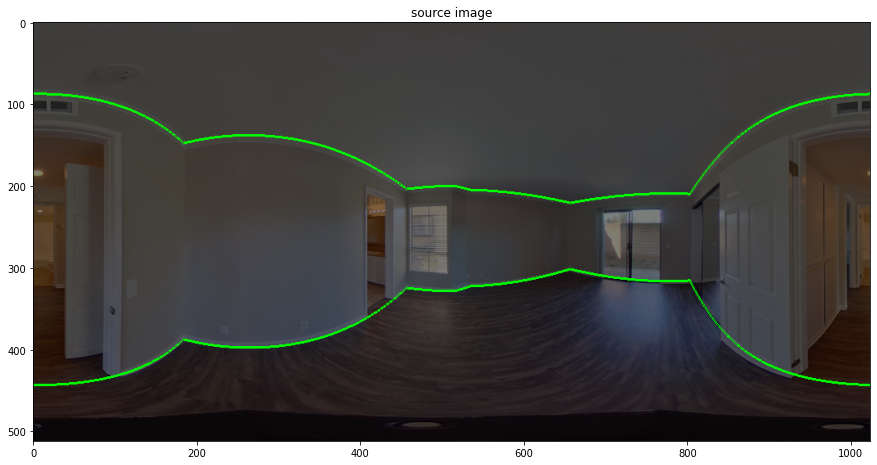

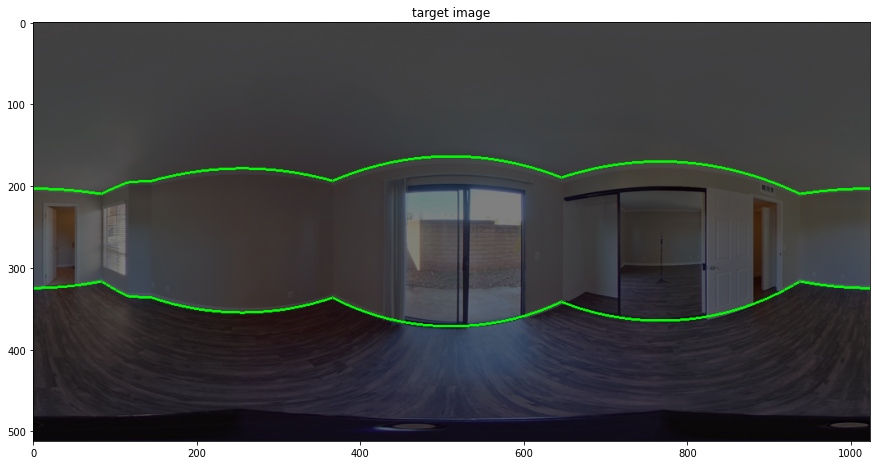

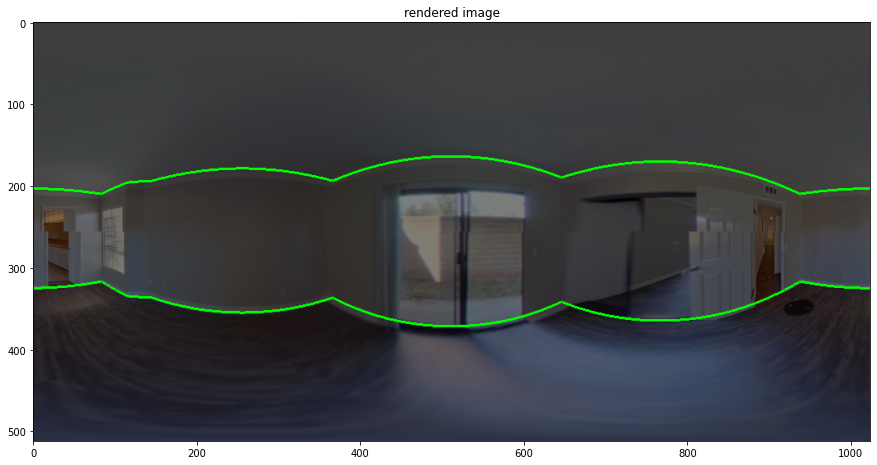

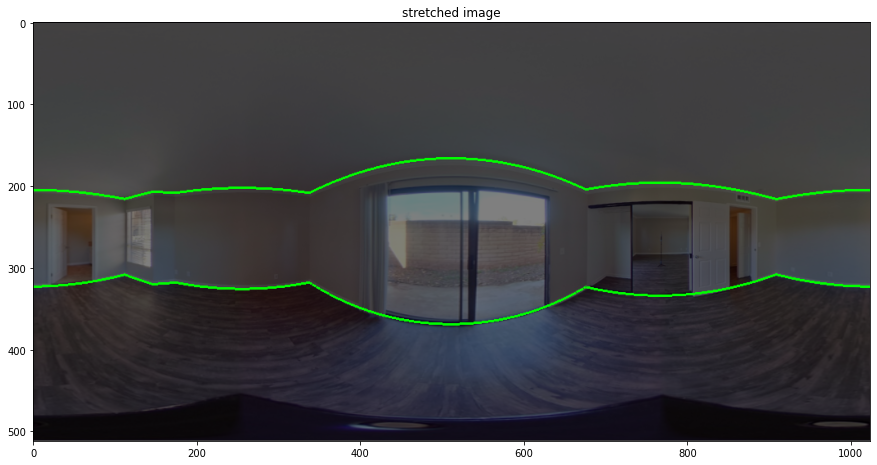

In [181]:
sub_dir = os.path.join(save_dir, 'render')
# os.mkdir(sub_dir)
i = 0
src = Transformation2D.from_zind_data(anns[0]['floor_plan_transformation'])
target = Transformation2D.from_zind_data(anns[2]['floor_plan_transformation'])

src_transformer = Transformation2D(rotation_matrix=src.rotation_matrix[None], scale=src.scale[None, :, None], translation=src.translation[None])
target_transformer = Transformation2D(rotation_matrix=target.rotation_matrix[None], scale=target.scale[None, :, None], translation=target.translation[None])
_, H, W = imgs[2].shape

target_idx = 2
src_idx = 0

target_img = torch.FloatTensor(imgs[target_idx])
src_img = torch.FloatTensor(imgs[src_idx])

# print(target_img.shape)

target_cor = txts[target_idx]
src_cor = txts[src_idx]
# kx = np.random.uniform(1.0, 2.0)
# ky = np.random.uniform(1.0, 2.0)
# print('kx, ky:', kx, ky)
stretched_img, stretched_cor = panostretch.pano_stretch(target_img.permute(1, 2, 0), target_cor, kx, ky)

target_y_bon = torch.Tensor(cor_2_1d(target_cor, H, W))[None]
target_y_bon = torch.clip((target_y_bon / 2 + 0.5) * (H-1), 0, H-1)

src_y_bon = torch.Tensor(cor_2_1d(src_cor, H, W))[None]
src_y_bon = torch.clip((src_y_bon / 2 + 0.5) * (H-1), 0, H-1)

stretched_y_bon = torch.Tensor(cor_2_1d(stretched_cor, H, W))[None]
stretched_y_bon = torch.clip((stretched_y_bon / 2 + 0.5) * (H-1), 0, H-1)

# y_bon[0, 0, 300] = 170
# y_bon[0, 1, 300] = 322

ceiling_z = torch.ones(1, 1) * (anns[2]['ceiling_height'] - 1)
target_global_2d = compute_global(y_bon, target_transformer, H, W, ceiling_z)
grid = warp_index(src_transformer, target_transformer, target_y_bon, H, W, ceiling_z)[0]
rendered_img = F.grid_sample(src_img[None], grid[None])


target_img = target_img.detach().numpy().transpose(1, 2, 0).copy()
src_img = src_img.detach().numpy().transpose(1, 2, 0).copy()
rendered_img = rendered_img[0].detach().numpy().transpose(1, 2, 0).copy()
# stretched_img = stretched_img.transpose(1, 2, 0).copy()
# print(stretched_img.shape)

# print(grid)
radius = 1
color = (0, 1, 0)
thickness = 1
# col = 300
# for row in range(512):
#     coord = (col, row)
#     cv2.circle(target_img, coord, radius, color, thickness)
#     # cv2.circle(warp_img, coord, radius, color, thickness)
    
#     src_col, src_row = grid[row][col]
#     src_col, src_row = int(src_col.item() * W), int(src_row.item() * H)
#     coord = (src_col, src_row)
#     cv2.circle(src_img, coord, radius, color, thickness)

target_img *= 0.5
rendered_img *= 0.5
src_img *= 0.5
stretched_img *= 0.5

for col in range(1024):
    coord = (col, int(target_y_bon[0, 0, col].item()))
    cv2.circle(target_img, coord, radius, color, thickness)
    
    coord = (col, int(target_y_bon[0, 1, col].item()))
    cv2.circle(target_img, coord, radius, color, thickness)
    
    coord = (col, int(target_y_bon[0, 0, col].item()))
    cv2.circle(rendered_img, coord, radius, color, thickness)
    
    coord = (col, int(target_y_bon[0, 1, col].item()))
    cv2.circle(rendered_img, coord, radius, color, thickness)
    
    coord = (col, int(src_y_bon[0, 0, col].item()))
    cv2.circle(src_img, coord, radius, color, thickness)
    
    coord = (col, int(src_y_bon[0, 1, col].item()))
    cv2.circle(src_img, coord, radius, color, thickness)
    
    coord = (col, int(stretched_y_bon[0, 0, col].item()))
    cv2.circle(stretched_img, coord, radius, color, thickness)
    
    coord = (col, int(stretched_y_bon[0, 1, col].item()))
    cv2.circle(stretched_img, coord, radius, color, thickness)
    
plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(src_img)
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_img)
plt.figure(figsize=(15,10))
plt.title('rendered image')
plt.imshow(rendered_img)
plt.figure(figsize=(15,10)) 
plt.title('stretched image')
plt.imshow(stretched_img)

cv2.imwrite(os.path.join(sub_dir, 'src_img_layout.jpg'), (src_img[:, :, ::-1] * 255).astype(int))
cv2.imwrite(os.path.join(sub_dir, 'target_img_layout.jpg'), (target_img[:, :, ::-1] * 255).astype(int))
cv2.imwrite(os.path.join(sub_dir, 'rendered_img_layout.jpg'), (rendered_img[:, :, ::-1] * 255).astype(int))
cv2.imwrite(os.path.join(sub_dir, 'stretched_img_layout.jpg'), (stretched_img[:, :, ::-1] * 255).astype(int))

In [169]:
target_img.permute(1, 2, 0)

tensor([[[0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         ...,
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255]],

        [[0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         ...,
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255],
         [0.5216, 0.5137, 0.5255]],

        [[0.5176, 0.5098, 0.5137],
         [0.5176, 0.5098, 0.5137],
         [0.5176, 0.5098, 0.5137],
         ...,
         [0.5137, 0.5059, 0.5098],
         [0.5137, 0.5059, 0.5098],
         [0.5137, 0.5059, 0.5098]],

        ...,

        [[0.0863, 0.0588, 0.0824],
         [0.0863, 0.0588, 0.0824],
         [0.0863, 0.0588, 0.0824],
         ...,
         [0.0824, 0.0588, 0.0706],
         [0.0863, 0.0627, 0.0745],
         [0.0863, 0.0627, 0.0745]],

        [[0.0824, 0.0510, 0.0980],
         [0.0824, 0.0510, 0.0980],
         [0.

## Validation Map

In [7]:
sub_dir = os.path.join(save_dir, 'validation_map')
os.mkdir(os.path.join(sub_dir))

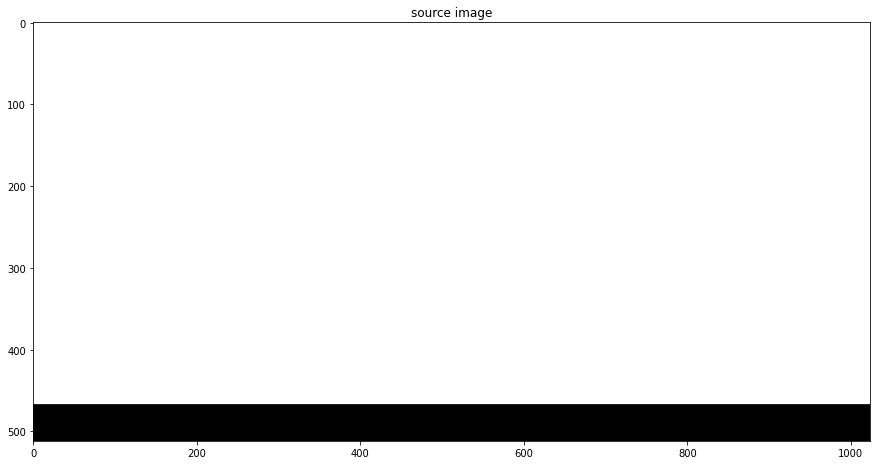

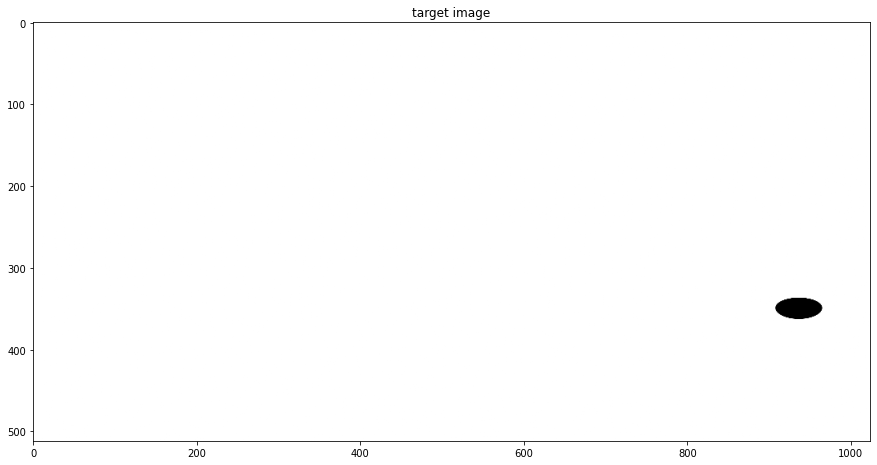

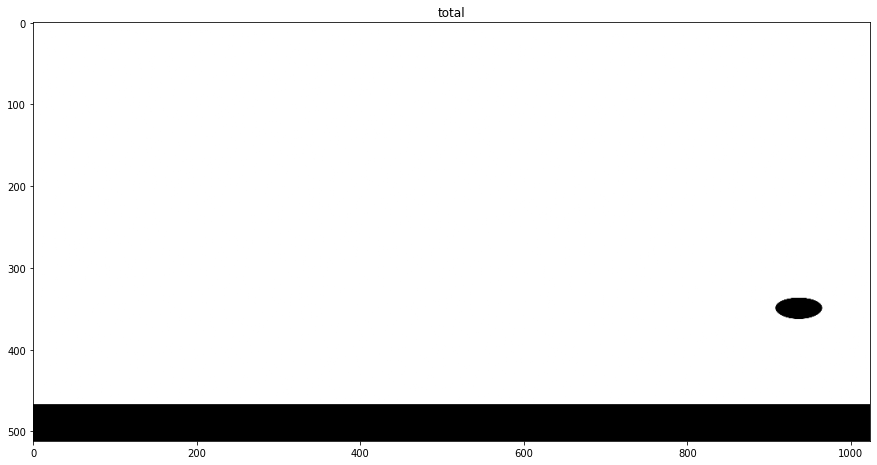

In [71]:
margin = 45
N = 1
H, W, C = src_img.shape
src_valid_map = torch.cat([torch.ones(N, C, H - margin, W), torch.zeros(N, C, margin, W)], axis=2)
target_valid_map = F.grid_sample(src_valid_map, grid[None])
valid_map = torch.clip(src_valid_map * target_valid_map, min=0., max=1.).detach()

src_valid_map = src_valid_map[0].detach().numpy().transpose(1, 2, 0).copy()
target_valid_map = target_valid_map[0].detach().numpy().transpose(1, 2, 0).copy()
valid_map = valid_map[0].detach().numpy().transpose(1, 2, 0).copy()

plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(src_valid_map)
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_valid_map)
plt.figure(figsize=(15,10))
plt.title('total')
plt.imshow(valid_map)

## Mahattan Alignment

In [136]:
sub_dir = os.path.join(save_dir, 'manhattan')
os.mkdir(os.path.join(sub_dir))

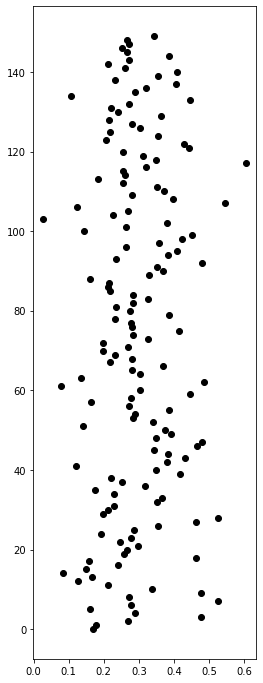

In [199]:
window_size = 150
x_mean = 0.3
x_var = 0.1
y_mean = 0.2
y_var = 0.05
xs = np.random.normal(x_mean, x_var, window_size)
# ys = np.random.normal(y_mean, y_var, window_size)
ys = np.arange(window_size)

line_length = 0.25
x_median = np.median(xs)
y_median = np.median(ys)

camera_x = np.zeros(1)
camera_y = np.zeros(1)

plt.figure(figsize=(4,12))
plt.scatter(xs, ys, c='black')

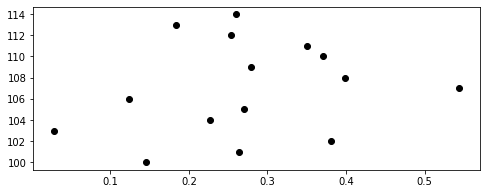

In [201]:
# window_size = 15
# x_mean = 0.3
# x_var = 0.1
# y_mean = 0.2
# y_var = 0.05
# xs = np.random.normal(x_mean, x_var, window_size)
# ys = np.random.normal(y_mean, y_var, window_size)
partial_xs = xs[100:115]
partial_ys = ys[100:115]

line_length = 0.25
x_median = np.median(xs)
y_median = np.median(ys)

camera_x = np.zeros(1)
camera_y = np.zeros(1)

plt.figure(figsize=(8,3))
plt.scatter(partial_xs, partial_ys, c='black')
# plt.scatter(-0.08, -0.08, c='black')
# plt.scatter(camera_x, camera_y, c='black')
# plt.scatter(x_median, y_median, c='red')
# plt.hlines(y_median, x_median - line_length/2, x_median + line_length/2, colors='red', linestyles='dashed')
# plt.vlines(x_median, y_median - line_length/2, y_median + line_length/2, colors='red', linestyles='dashed')

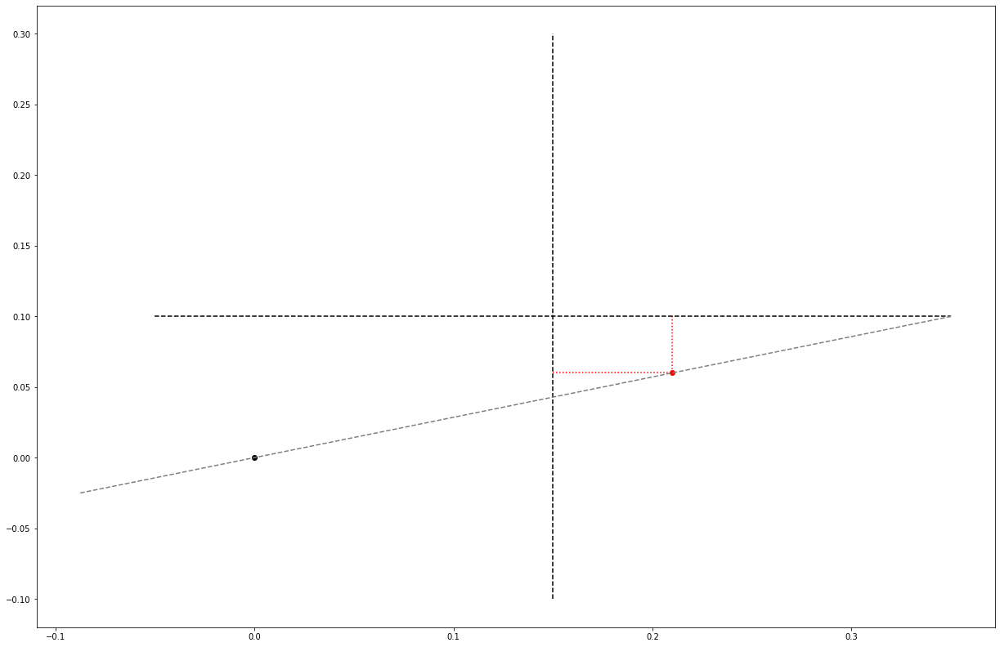

In [145]:
x_median = 0.15
y_median = 0.1


plot_start_x = 0.35
plot_start_y = 0.1

ratio = 0.6
point_x = plot_start_x * ratio
point_y = plot_start_y * ratio

line_length = 0.4

plt.figure(figsize=(21,14))
plt.scatter(point_x, point_y, c='red')
# plt.scatter(-0.12, -0.12, c='black')
plt.scatter(camera_x, camera_y, c='black')
plt.plot([plot_start_x, -plot_start_x*0.25], [plot_start_y, -plot_start_y*0.25], c='gray', linestyle='dashed')
plt.hlines(point_y, x_median, point_x, colors='red', linestyles='dotted')
plt.vlines(point_x, point_y, y_median, colors='red', linestyles='dotted')

# plt.scatter(x_median, y_median, c='black')
plt.hlines(y_median, x_median - line_length/2, x_median + line_length/2, colors='black', linestyles='dashed')
plt.vlines(x_median, y_median - line_length/2, y_median + line_length/2, colors='black', linestyles='dashed')
# plt.savefig(os.path.join(sub_dir, 'mahattan.jpg'))

In [67]:
src_valid_map.shape, target_valid_map.shape
src_img.shape

(512, 1024, 3)

In [35]:
a, b = grid[300][200]
a

tensor(0.5649)

In [23]:
t = 800
T = 800*100*0.3
iter_ratio = min(t / T, 1.)
np.exp(-5 * (1 - iter_ratio)**2)

0.009351465385664462

In [28]:
np.random.randint(100)

82

# Proof

tensor([[[-0.0698, -0.0697, -0.0697,  ..., -0.0698, -0.0698, -0.0698],
         [ 0.0961,  0.0961,  0.0961,  ...,  0.0961,  0.0961,  0.0961]]])
torch.Size([1, 2048, 2])


/home/joshua049/anaconda3/envs/pytorch3d/lib/python3.8/site-packages/torch/nn/functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


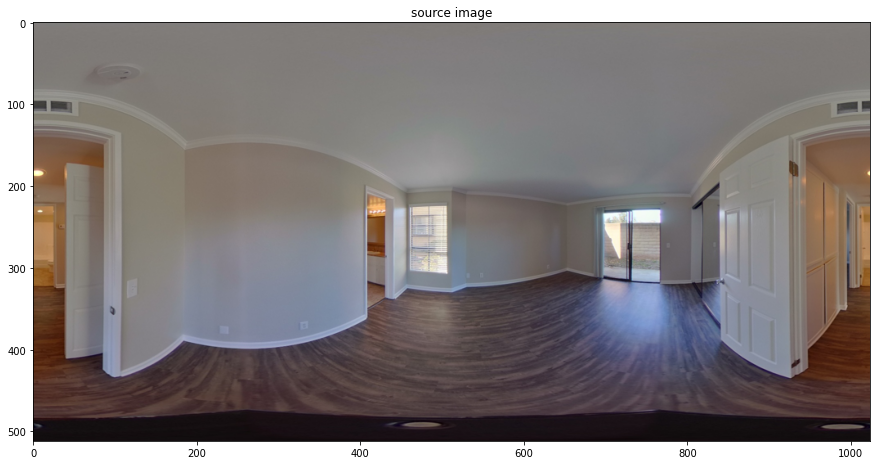

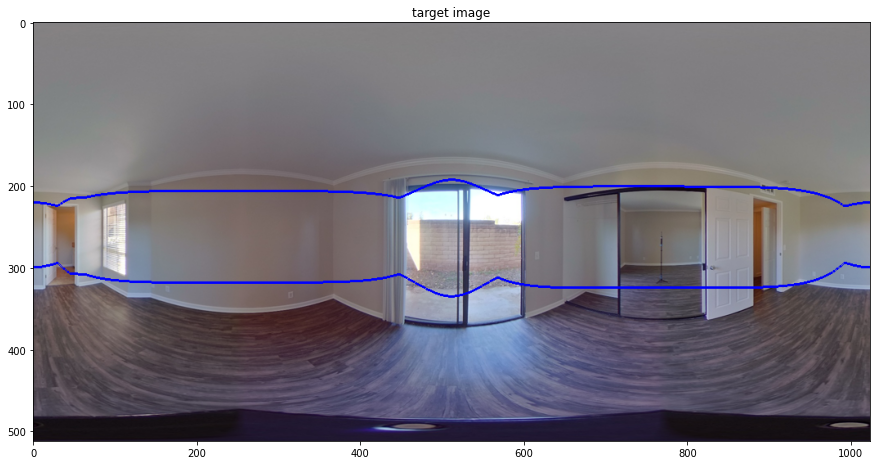

In [9]:
i = 0
src = Transformation2D.from_zind_data(anns[0]['floor_plan_transformation'])
target = Transformation2D.from_zind_data(anns[2]['floor_plan_transformation'])

src_transformer = Transformation2D(rotation_matrix=src.rotation_matrix[None], scale=src.scale[None, :, None], translation=src.translation[None])
target_transformer = Transformation2D(rotation_matrix=target.rotation_matrix[None], scale=target.scale[None, :, None], translation=target.translation[None])
# net = HorizonNet('resnet50', True)
_, H, W = imgs[2].shape
# y_bon = net(imgs[2][None])[0]
# imgs[2], txts[2] = pano_stretch
target_img = imgs[2].detach().numpy().transpose(1, 2, 0).copy()
kx, ky = 3, 1
_, target_bon = panostretch.pano_stretch(target_img, txts[2], kx, ky)
y_bon = torch.Tensor(cor_2_1d(target_bon, H, W))[None]
print(y_bon)
y_bon = torch.clip((y_bon / np.pi + 0.5) * (H-1), 0, H-1)
# y_bon = torch.zeros(W) + 260
# print(y_bon.shape)
# ceiling_z = ceiling_height[:1] - 1.
ceiling_z = torch.ones(1, 1) * 0.7
# prev = target_global_2d
target_global_2d = compute_global(y_bon, target_transformer, H, W, ceiling_z)
z = torch.cat([torch.zeros(1024) + ceiling_z[0, 0], torch.zeros(1024) - 1.]).reshape(2048, 1)
target_local_2d = target_transformer.apply_inverse(target_global_2d.clone()) / torch.Tensor([ky, kx])[None, None, :]
# target_local_2d = target_transformer.apply_inverse(target_global_2d.clone()) 
target_global_stretch = target_transformer.to_global(target_local_2d.clone())
print(target_local_2d.shape)
target_local_3d = torch.cat([target_local_2d[0], z], dim=-1)
y_bon = TransformationSpherical.cartesian_to_pixel(target_local_3d.reshape(-1, 3), 1024).reshape(-1, 2, 1024, 2)[:, :, :, 1]
# target_global_2d -= target.translation[None]
# target_global_2d[:, :, 0] /= kx
# target_global_2d[:, :, 1] /= ky


start = 0
end = 256
height = torch.Tensor([anns[2]['ceiling_height'] - 1.])[None]
grid = warp_index(src_transformer, target_transformer, y_bon, 512, 1024, height)
warp_img = F.grid_sample(imgs[0][None], grid)[0]

# loss = (((imgs[2] - warp_img)**2) * valid_map).mean()

# loss = torch.nn.MSELoss()(imgs[2], warp_img)
# print(loss)
# loss.backward()


warp_img = warp_img.detach().numpy().transpose(1, 2, 0).copy()
# print(target_img.shape)
radius = 1
color = (0, 0, 255)
thickness = 1
for col in range(1024):
    coord = (col, int(y_bon[0, 0][col].item()))
    cv2.circle(target_img, coord, radius, color, thickness)
    cv2.circle(warp_img, coord, radius, color, thickness)
    
    coord = (col, int(y_bon[0, 1][col].item()))
    cv2.circle(target_img, coord, radius, color, thickness)
    cv2.circle(warp_img, coord, radius, color, thickness)


plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(imgs[0].detach().permute(1, 2, 0))
# plt.figure(figsize=(15,10))
# plt.title('warped image')
# plt.imshow((warp_img))
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_img)
# plt.figure(figsize=(15,10))
# plt.scatter(target_global_2d[i, :1024, 0], target_global_2d[i, :1024, 1],c="red")
# plt.scatter(prev[i, :1024, 0], prev[i, :1024, 1],c="blue")

In [504]:
target_global_2d.shape

torch.Size([1, 4096, 2])

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow((((imgs[2] - warp_img)**2)).detach().permute(1, 2, 0).numpy())
plt.figure(figsize=(15,10))
plt.imshow((((imgs[2] - warp_img)**2) * valid_map).detach().permute(1, 2, 0).numpy())

In [ ]:
for p in net.parameters():
    if p.grad is not None:
        print(p.grad)

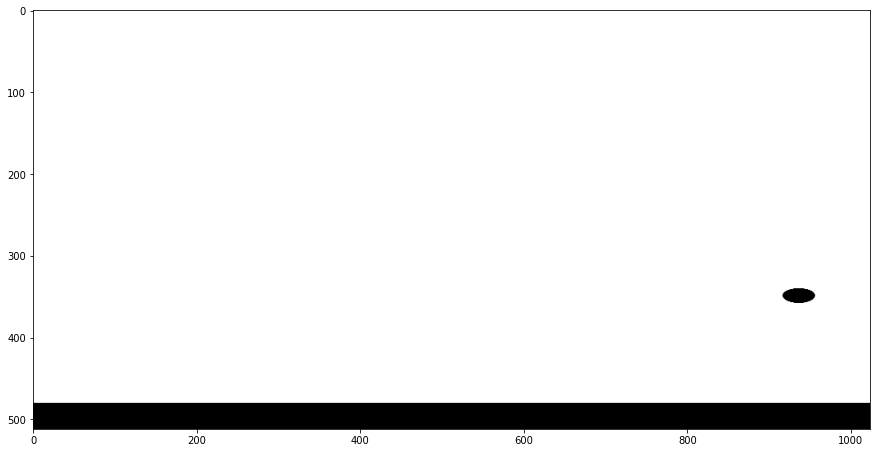

In [90]:
src_valid_map = torch.cat([torch.ones(480, 1024), torch.zeros(32, 1024)])
target_valid_map = F.grid_sample(src_valid_map[None, None], grid)[0]
plt.figure(figsize=(15,10))
plt.imshow((src_valid_map + target_valid_map[0]).detach(), cmap='gray')

In [21]:
torch.min(torch.abs(-1 / torch.tan(torch.Tensor([0.0]))), torch.Tensor([5.]))

tensor([5.])

In [76]:
rescale_grid = (grid[0] / 2 + 0.5).numpy()
rescale_grid[:, :, 0] *= W
rescale_grid[:, :, 1] *= H

In [116]:
z = torch.autograd.Variable(torch.Tensor([1]), requires_grad=True)
r = torch.autograd.Variable(torch.sqrt(z**2 + boundary_dist**2), requires_grad=True)
# k = torch.autograd.Variable(torch.Tensor([0.9]), requires_grad=True)
k = z / r
c = torch.asin(k)
c.backward()
z.grad, r.grad, k

(tensor([116.5024]),
 tensor([-116.4981]),
 tensor([1.0000], grad_fn=<DivBackward0>))

In [115]:
target_bon = torch.Tensor([510])
boundary_phi = (0.5 - (target_bon / 512)) * np.pi # (N, 1024)
boundary_dist = torch.abs(0.7 / torch.tan(boundary_phi)) # (N, 1024)
boundary_dist, boundary_phi

(tensor([0.0086]), tensor([-1.5585]))

In [77]:
rescale_grid[:, 400, :]

array([[687.9741 , 186.44958],
       [687.88043, 186.68246],
       [687.78754, 186.91391],
       ...,
       [687.69525, 346.1902 ],
       [687.78754, 346.46738],
       [687.88043, 346.746  ]], dtype=float32)

In [82]:
thickness

1

In [3]:
col = 200
target_img = imgs[2].detach().numpy().transpose(1, 2, 0).copy()
src_img = imgs[0].detach().numpy().transpose(1, 2, 0).copy()

thickness = 1
color = (0, 0, 255)
for i, (src_x, src_y) in enumerate(rescale_grid[:, col, :].astype(int)):
    target_x, target_y = col, i
    
    coord = (target_x, target_y)
    cv2.circle(target_img, coord, radius, color, thickness)
    
    coord = (src_x, src_y)
    cv2.circle(src_img, coord, radius, color, thickness)
    #print(coord)

thickness = 3
color = (255, 0, 0)
coord = (col, int(y_bon[0, 0][col].item()))
cv2.circle(target_img, coord, radius, color, thickness)    

color = (255, 0, 0)
coord = (col, int(y_bon[0, 1][col].item()))
cv2.circle(target_img, coord, radius, color, thickness)   
    
    
plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(src_img)
# plt.figure(figsize=(15,10))
# plt.title('warped image')
# plt.imshow(warp_img.detach().permute(1, 2, 0))
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_img)

NameError: name 'rescale_grid' is not defined

In [ ]:
anns[0]['ceiling_height'], anns[2]['ceiling_height']

In [2]:
data = pd.read_csv('matterport_train_splits.csv')

In [10]:
str(50)

'50'

In [12]:
data

,fileid,50,100,200,400
0,sT4fr6TAbpF_6ae4a52e16074a7f9e8cbbba2bf16eac,0,0,0,0
1,WYY7iVyf5p8_f024612e20c544e29823e91d6d1c94f6,0,0,0,0
2,qoiz87JEwZ2_d3020d8bf0cb45fd881991cd53e38baf,0,0,0,0
3,oLBMNvg9in8_424bcb744623413f830ece5c68319d70,0,0,0,0
4,2n8kARJN3HM_ea42c4694c05490eb7ae29590321e1a3,0,0,0,0
...,...,...,...,...,...
1645,sT4fr6TAbpF_5d8d5fbcc95e47b4be3ef51862b4d1f8,0,0,0,0
1646,E9uDoFAP3SH_6d88b250b28f4f28afbcf356f6a33909,0,0,0,0
1647,5ZKStnWn8Zo_98bb0382d3cc414eae935481bab324dd,0,0,0,0
1648,5ZKStnWn8Zo_e51817dd7c914c66a74365729c79c211,0,0,0,0


In [11]:
data.columns

Index(['fileid', '50', '100', '200', '400'], dtype='object')

In [9]:
data['fileid'][data['50']==1]

18      ur6pFq6Qu1A_ad506c95650a444eb205c2f9ebbd26fc
45      VzqfbhrpDEA_5ae7f77201964f5386990b3ce719df94
58      PX4nDJXEHrG_ea6f8b054a3b493482b183a6e92b9aa7
171     E9uDoFAP3SH_72e7bae027f34e898f90309032ecd3a6
177     TbHJrupSAjP_cd75880d832a4346b5c1f2210d3e63d4
192     2n8kARJN3HM_93d8bda24efa4269856f731192146f87
230     ARNzJeq3xxb_2e304220c00c4d41b9f687ed1f11c3ef
234     vyrNrziPKCB_e642c08656284353abdd1fe071ad1582
361     2azQ1b91cZZ_ac3dc08c7a2646b991fda42ccc42bc47
438     sT4fr6TAbpF_8138835f78064c28b6c9c35a89eda7d6
470     759xd9YjKW5_14af8cbc71694b0ab5ca408ceb1c2cdb
481     sKLMLpTHeUy_a78f668e5f7b4afebd355b946aeb9422
492     SN83YJsR3w2_c94b508e103a4af2a7d54920ca214634
522     E9uDoFAP3SH_3384e4644c644c85980470220aa3e101
575     jtcxE69GiFV_27535f650b78489abcf2397c1eaa3037
743     i5noydFURQK_6975b20fd2964adcbe00ee81f5afbb2f
832     ur6pFq6Qu1A_e712e90c48dc4baf9261c51ffc15660b
863     QUCTc6BB5sX_8a934837258740e686974eb02265db7f
932     ARNzJeq3xxb_882a57bbdf9d4e8983ad44fc93

In [ ]:
ChamferDistance

In [ ]:
pytorch3d

In [ ]:
y_bon.grad

In [ ]:
pseudo_target = torch.randn(1, 1, 1024)
pseudo_loss = torch.nn.MSELoss()(y_bon, pseudo_target)
pseudo_loss.backward()

In [ ]:
net.load_state_dict(torch.load('./ckpt/try_nan/'))

In [ ]:
for p in net.parameters():
    if p.grad is not None:
        print(p.grad)

In [ ]:
for p in net.parameters():
    if p.grad is not None:
        print(p.grad)

In [ ]:
y_bon = cor_2_1d(txts[0], 512, 1024)
y_bon = np.clip(((y_bon / np.pi + 0.5) * 511).round().astype(int), 0, 511)

In [ ]:
warp_img = torch.empty(3, 224, 1024)
view_transformer = Transformation2D.from_zind_data(anns[0]['floor_plan_transformation'])
proj_transformer = Transformation2D.from_zind_data(anns[2]['floor_plan_transformation'])
# for col in tqdm(range(1024)):
#     proj = guess(imgs[0].clone(), view_transformer, imgs[2].clone(), proj_transformer, col, y_bon[1, col], 256, 480)
#     warp_img[:, :, col] = proj

In [ ]:
warp_img.numpy().transpose(1, 2, 0).shape

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(warp_img.numpy().transpose(1, 2, 0))

In [ ]:
proj_img = torch.empty(223, 1024, 3)

In [ ]:
all_json = glob.glob(os.path.join('/mnt/home_6T/sunset/zind/*/label_cor_noocc', 'floor_01_partial_room_*.json'))

In [ ]:
all_json

In [ ]:
all_scenes = {}
for filename in all_json:
    partial_room_id, pano_id = filename.split('_pano_')
    if partial_room_id in all_scenes:
        all_scenes[partial_room_id].append(pano_id)
    else:
        all_scenes[partial_room_id] = [pano_id]

In [ ]:
num = 0
max_len = 0
for k, v in all_scenes.items():
    if len(v) >= 2:
        num += 1
    if len(v) >= max_len:
        max_len = len(v)
num, max_len

In [ ]:
t_2d = Transformation2D.from_zind_data(anns[0]['floor_plan_transformation'])

In [ ]:
t_2d.scale

In [ ]:
t_2d

In [ ]:
torch.Tensor([2]).item()

In [ ]:
Transformation2D(rotation_matrix=t_2d.rotation_matrix, scale=t_2d.scale, translation=t_2d.translation)

In [ ]:
test_dataset = ZillowIndoorDataset(
        root_dir='/mnt/home_6T/sunset/zind', subject='val')

In [ ]:
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation = dataset[100]

In [ ]:
src_transformer = Transformation2D(rotation_matrix=src_rotation_matrix, scale=src_scale, translation=src_translation)
target_transformer = Transformation2D(rotation_matrix=target_rotation_matrix, scale=target_scale, translation=target_translation)

## Door

In [4]:
class DoorNet(nn.Module):
    def __init__(self):
        super(DoorNet, self).__init__()
        self.feature_extractor = models.resnet18(pretrained=True)
        self.fc = nn.Linear(1000, 1024)
        self.sigmoid = nn.Sigmoid()        
    
    def forward(self, x):
        x = self.feature_extractor(x)
        x = self.fc(x)
        x = self.sigmoid(x)
        return x

In [73]:
x = torch.randn(4, 1024).reshape(-1)
x.shape

torch.Size([4096])

In [2]:
doornet = DoorNet()
doornet.load_state_dict(torch.load('./ckpt/door/best.pth', map_location=torch.device('cpu'))['state_dict'])
# net(x[None]).shape

<All keys matched successfully>

In [3]:
door_dataset = ZillowIndoorDoorDataset(
        root_dir='/mnt/home_6T/sunset/zind', subject='val')
len(door_dataset)

2830

In [41]:
nn.BCELoss()(torch.Tensor([[0.3]]), torch.Tensor([[0.]]))

tensor(0.3567)

In [389]:
def rotate(x, angle):
    return np.concatenate([x[:, angle:], x[:, :angle]], axis=1)

In [51]:
doorbar.shape

torch.Size([3, 30, 1024])

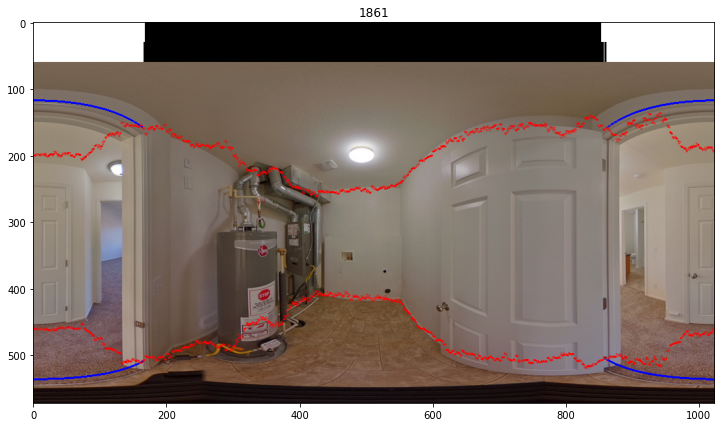

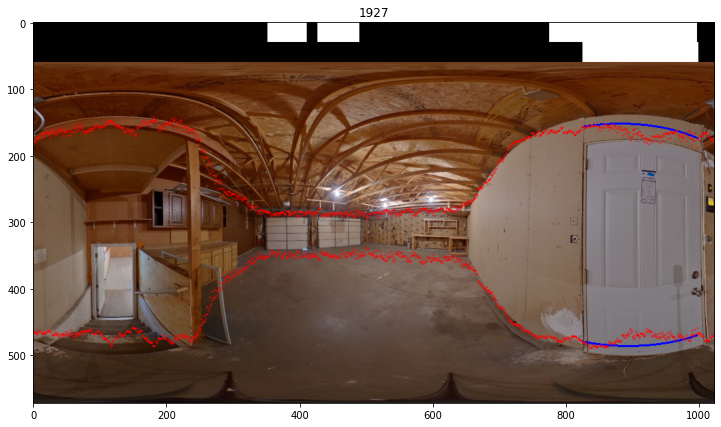

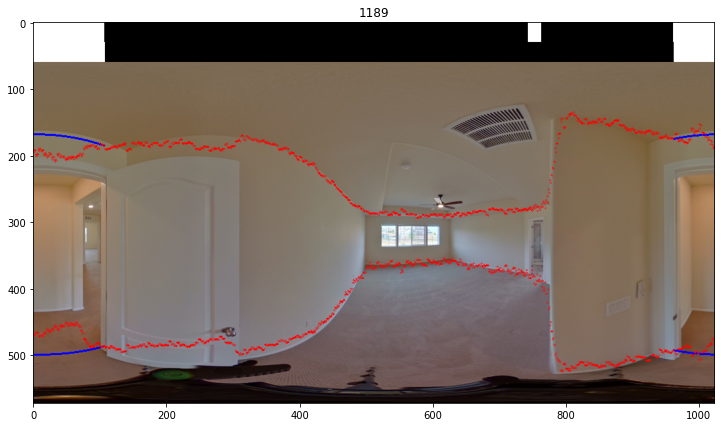

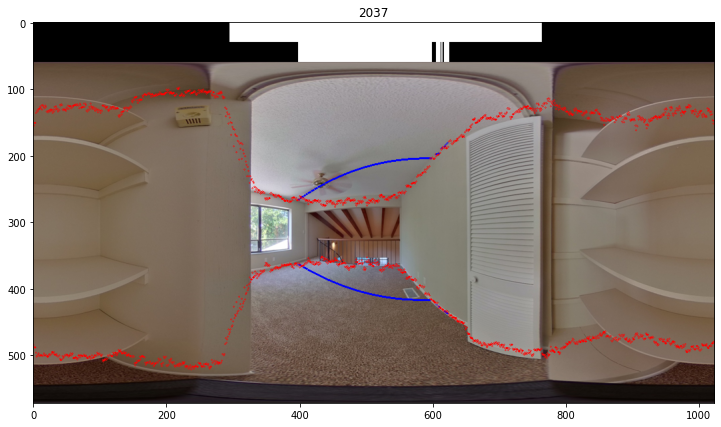

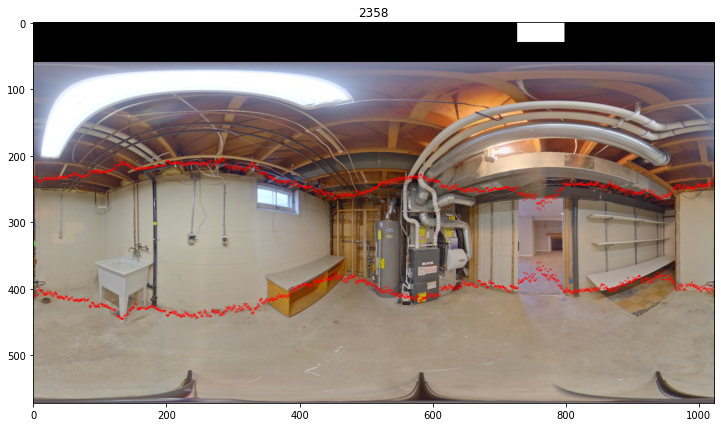

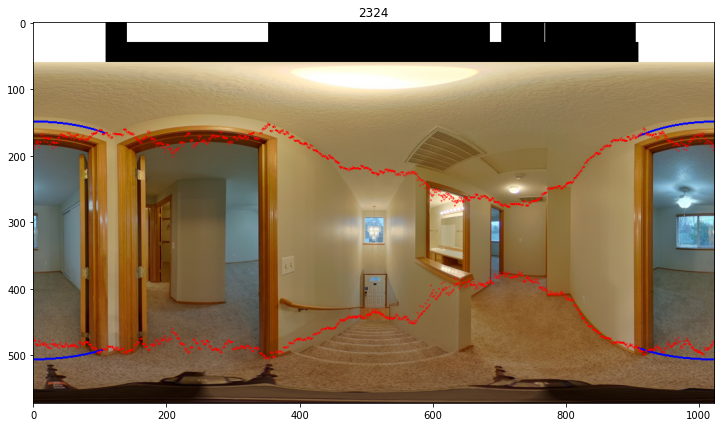

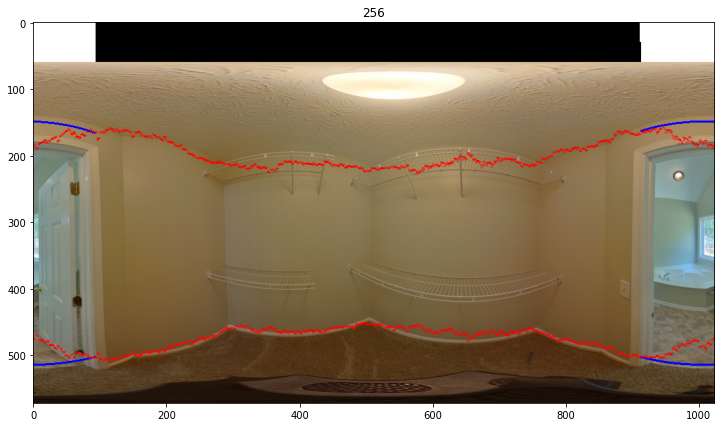

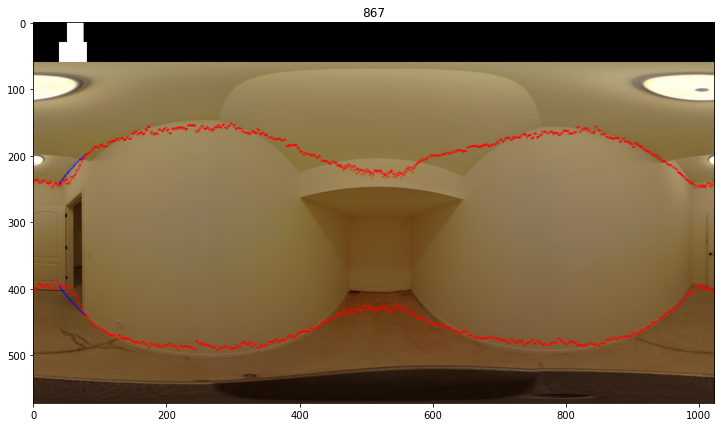

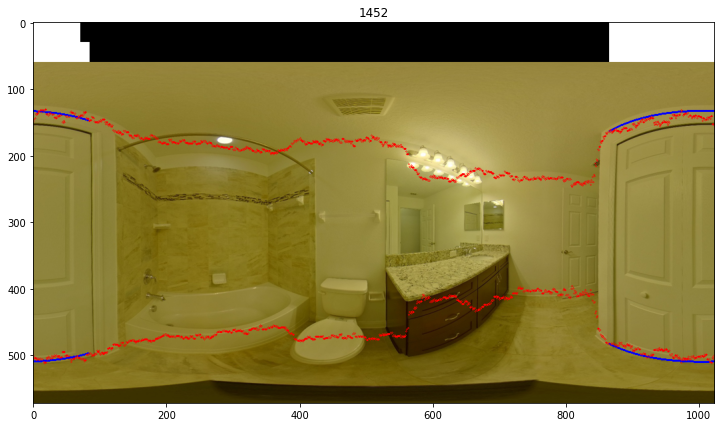

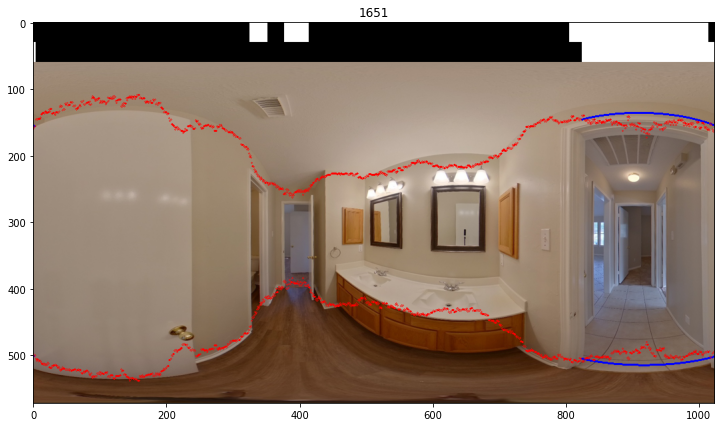

In [11]:
# ith = np.random.randint(len(door_dataset))
iths = np.random.choice(len(door_dataset), 10)
# idx = 486
# idx = 1596
# idx = 1396
H = 512

for ith in iths:
    # print(ith)
    x, doorbar_ = door_dataset[ith]
    # net.load_state_dict(torch.load('./ckpt/door/best_valid_11.pth')['state_dict'])
    doorbar = torch.where(doornet(x[None])[0] > 0.3, 1., 0.)
    # doorbar = doornet(x[None])[0]
    # y_bon_ori = net(x[None])[0]
    y_bon = (nets[0](x[None])[0] / 2 + 0.5) * (H-1)
    # doorbar = net(x[None])


    diffs = np.diff(doorbar)
    starts = np.argwhere(diffs == 1).reshape(-1)
    stops = np.argwhere(diffs == -1).reshape(-1)

    y_bon_new = y_bon.detach().numpy().copy()
    if len(stops) > 0:
        if stops[0] < starts[0]:
            stops = np.concatenate([stops[1:], stops[:1]])
        if len(starts) < len(stops):
            starts = np.concatenate([starts, np.array([0])])


        for start, stop in zip(starts, stops):
            p1 = np.array([start, y_bon_new[0, start]])
            p2 = np.array([stop, y_bon_new[0, stop]])
            new_bon = panostretch.pano_connect_points(p1, p2, z=-50)[1:-1, 1]
            if start > stop:
                y_bon_new[0, start+1:], y_bon_new[0, :stop] = np.split(new_bon, [1024-start-1,])

            else:
                y_bon_new[0, start+1:stop] = new_bon

            p1 = np.array([start, y_bon_new[1, start]])
            p2 = np.array([stop, y_bon_new[1, stop]])
            new_bon = panostretch.pano_connect_points(p1, p2, z=50)[1:-1, 1]
            if start > stop:
                y_bon_new[1, start+1:], y_bon_new[1, :stop] = np.split(new_bon, [1024-start-1,])

            else:
                y_bon_new[1, start+1:stop] = new_bon


    doorbar = doorbar.expand(3, 30, 1024)
    doorbar_ = doorbar_.expand(3, 30, 1024)
    x = torch.cat([doorbar_, doorbar, x], dim=1).detach().numpy().transpose(1, 2, 0).copy()

    # x = rotate(x, 50)
    # x = x.detach().numpy().transpose(1, 2, 0).copy()

    radius = 1
    blue = (0, 0, 1)
    red = (1, 0, 0)
    thickness = 1
    for col in range(1024):
        coord = (col, int(y_bon_new[0, col]) + 60)
        cv2.circle(x, coord, radius, blue, thickness)

        coord = (col, int(y_bon_new[1, col]) + 60)
        cv2.circle(x, coord, radius, blue, thickness)

        coord = (col, int(y_bon[0, col]) + 60)
        cv2.circle(x, coord, radius, red, thickness)

        coord = (col, int(y_bon[1, col]) + 60)
        cv2.circle(x, coord, radius, red, thickness)


    plt.figure(figsize=(14, 7))
    plt.title(ith)
    plt.imshow(x)

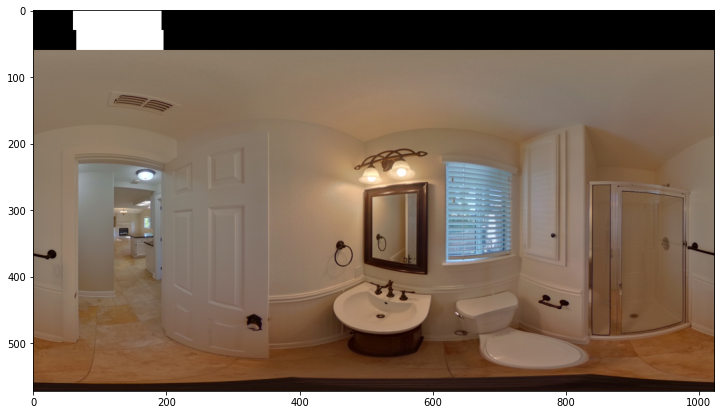

In [410]:
x = rotate(x, 100)

    
plt.figure(figsize=(14, 7))
plt.imshow(x)

In [226]:
diffs

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [231]:
starts, stops

(array([ 132,  156, 1003]), array([140, 229,  13]))

In [103]:
def cor_2_1d(cor, H, W):
    bon_ceil_x, bon_ceil_y = [], []
    bon_floor_x, bon_floor_y = [], []
    n_cor = len(cor)
    for i in range(n_cor // 2):
        xys = panostretch.pano_connect_points(cor[i*2],
                                              cor[(i*2+2) % n_cor],
                                              z=-50, w=W, h=H)
        bon_ceil_x.extend(xys[:, 0])
        bon_ceil_y.extend(xys[:, 1])
    for i in range(n_cor // 2):
        xys = panostretch.pano_connect_points(cor[i*2+1],
                                              cor[(i*2+3) % n_cor],
                                              z=50, w=W, h=H)
        bon_floor_x.extend(xys[:, 0])
        bon_floor_y.extend(xys[:, 1])
        
    bon = np.zeros((2, W))
    bon_ceil_x, bon_ceil_y = sort_xy_filter_unique(bon_ceil_x, bon_ceil_y, y_small_first=True)
    bon[0] = np.interp(np.arange(W), bon_ceil_x, bon_ceil_y, period=W)
    
    bon_floor_x, bon_floor_y = sort_xy_filter_unique(bon_floor_x, bon_floor_y, y_small_first=False)
    bon[1] = np.interp(np.arange(W), bon_floor_x, bon_floor_y, period=W)       

    return bon

In [180]:
x, doorbar_ = dataset[idx]
diffs = np.diff(doorbar_)
starts = np.argwhere(diffs == 1).reshape(-1)
stops = np.argwhere(diffs == -1).reshape(-1)
# not_door = np.argwhere(doorbar_==0)[0]
# cor = torch.zeros((len(not_door)*2, 2))
# for col, y_bon in zip(not_door, y_bon[:, doorbar_==0].T):
#     cor[col, ]

In [186]:
starts, stops

(array([406, 977]), array([612,  34]))

In [182]:
if stops[0] < starts[0]:
    stops = np.concatenate([stops[1:], stops[:1]])

In [210]:
# starts, stops
# y_bon = y_bon.detach().numpy()
y_bon_new = y_bon.copy()
for start, stop in zip(starts, stops):
    p1 = np.array([start, y_bon[0, start]])
    p2 = np.array([stop, y_bon[0, stop]])
    new_bon = panostretch.pano_connect_points(p1, p2, z=-50)[1:-1, 1]
    if start > stop:
        y_bon_new[0, start+1:], y_bon_new[0, :stop] = np.split(new_bon, [1024-start-1,])
        # y_bon_new[0, start+1:] = new_bon[1024-start:]
        # y_bon_new[0, :stop] = new_bon[:stop]
        # pass
    else:
        y_bon_new[0, start+1:stop] = new_bon
    # print(panostretch.pano_connect_points(p1, p2, z=-50))

In [209]:
np.split(new_bon, [1024-start-1, ])

[array([155.94313605, 155.58415297, 155.22915767, 154.87813522,
        154.53107071, 154.1879492 , 153.84875579, 153.51347559,
        153.18209371, 152.8545953 , 152.53096555, 152.21118967,
        151.89525295, 151.58314067, 151.27483822, 150.97033101,
        150.66960453, 150.37264434, 150.07943605, 149.78996538,
        149.5042181 , 149.22218007, 148.94383726, 148.6691757 ,
        148.39818153, 148.130841  , 147.86714045, 147.60706631,
        147.35060516, 147.09774366, 146.84846859, 146.60276685,
        146.36062546, 146.12203158, 145.88697246, 145.65543552,
        145.42740828, 145.2028784 , 144.9818337 , 144.7642621 ,
        144.55015168, 144.33949067, 144.13226743, 143.92847046,
        143.72808844, 143.53111017]),
 array([143.3375246 , 143.14732084, 142.96048818, 142.77701602,
        142.59689395, 142.42011171, 142.2466592 , 142.07652647,
        141.90970376, 141.74618146, 141.5859501 , 141.42900043,
        141.27532331, 141.12490981, 140.97775116, 140.83383874,
  

In [475]:
torch.min(torch.Tensor([1.]), torch.Tensor([-np.inf]))

tensor([-inf])

# Load Model and Dataset

In [64]:
# zillow = ZillowIndoorDataset(
#         root_dir='/mnt/home_6T/sunset/zind', subject='val', flip=False, rotate=False, gamma=False, return_cor=True,
#             stretch=False)
# # loader = DataLoader(dataset, 2)
# # it = iter(loader)
# mp3d = PanoCorBonDataset(
#             root_dir='/mnt/home_6T/sunset/mp3d_layout/valid_no_occ', return_cor=True,
#             flip=False, rotate=False, gamma=False,
#             stretch=False)
# # net = HorizonNet('resnet50', True)
# nets = [HorizonNet('resnet50', True) for i in range(3)]
# nets[0].load_state_dict(torch.load('./ckpt/cycle_1/best_valid.pth', map_location=torch.device('cpu'))['state_dict'])
# nets[1].load_state_dict(torch.load('./ckpt/geometric_0/best_valid.pth', map_location=torch.device('cpu'))['state_dict'])
# nets[2].load_state_dict(torch.load('./ckpt/src_tgt_1/best_valid.pth', map_location=torch.device('cpu'))['state_dict'])

# nets[0].load_state_dict(torch.load('./ckpt/cycle_1/last.pth')['state_dict'])
# nets[1].load_state_dict(torch.load('./ckpt/geometric_2/best_valid.pth')['state_dict'])
nets[2].load_state_dict(torch.load('./ckpt/src_tgt_1/best_valid.pth')['state_dict'])
# nets[2].load_state_dict(torch.load('./ckpt/parallel/best.pth')['state_dict'])

# for net in nets:
#     net.eval()
# doornet = DoorNet()
# doornet.load_state_dict(torch.load('./ckpt/door_sub/best.pth', map_location=torch.device('cpu'))['state_dict'])    
print()
# net.load_state_dict(torch.load('./ckpt/self_parallel/best_valid_1.pth')['state_dict'])

In [3]:
!usegpu

/bin/bash: usegpu: command not found


In [5]:
doornet = DoorNet()
doornet.load_state_dict(torch.load('./ckpt/door_sub/best.pth', map_location=torch.device('cpu'))['state_dict'])

<All keys matched successfully>

In [202]:
torch.cuda.is_available()

True

# Show Zillow

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:05<00:00,  1.05s/it]


5 pics saved


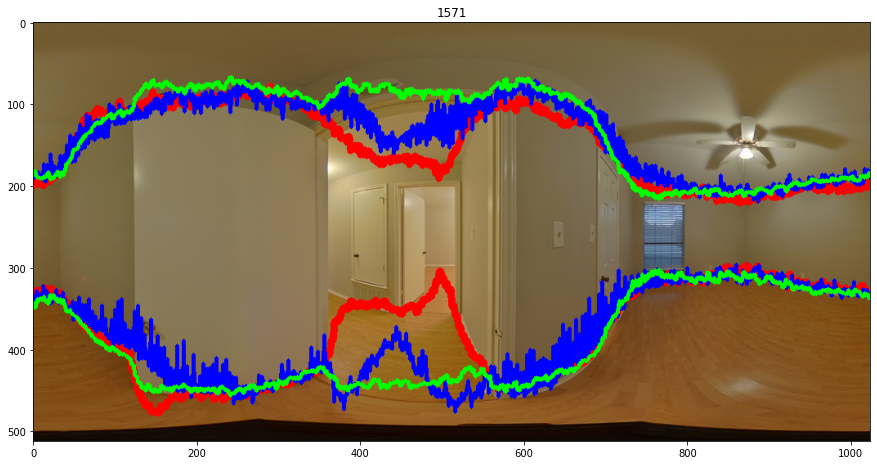

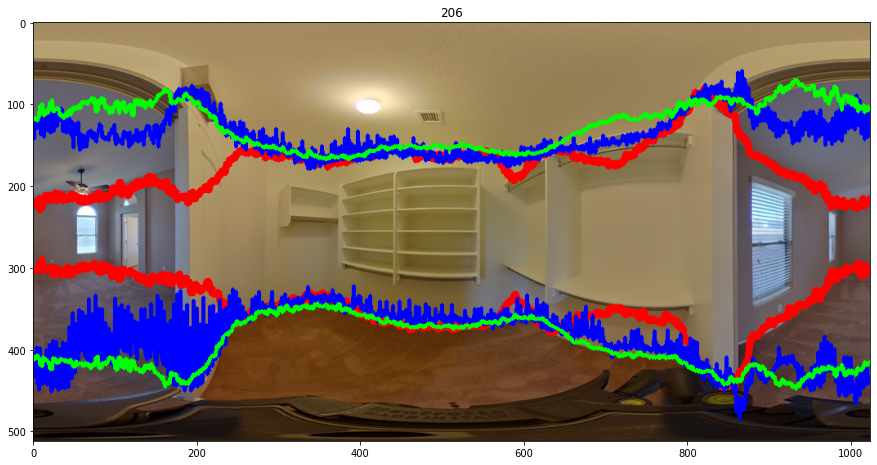

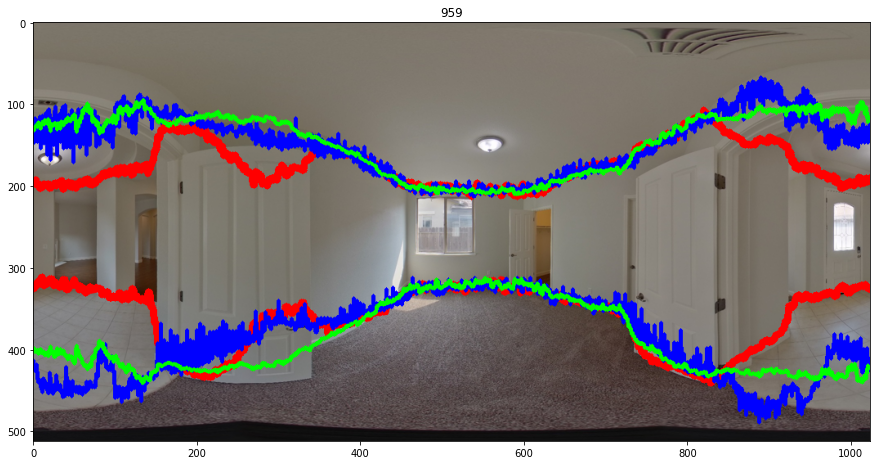

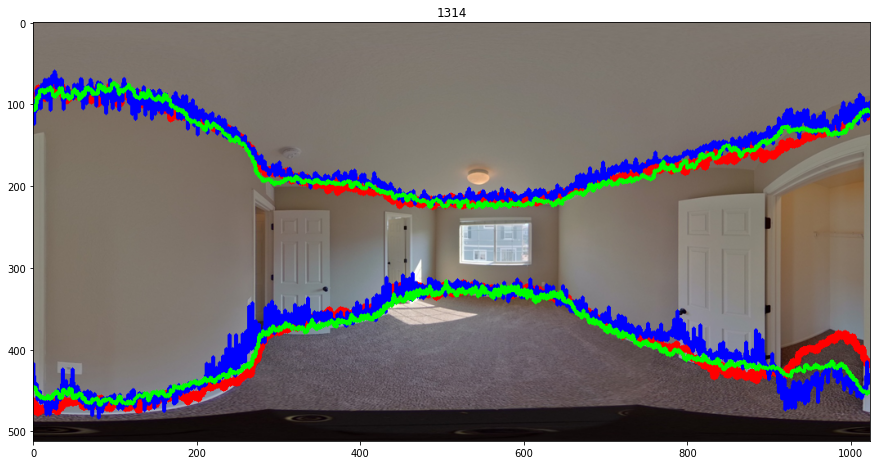

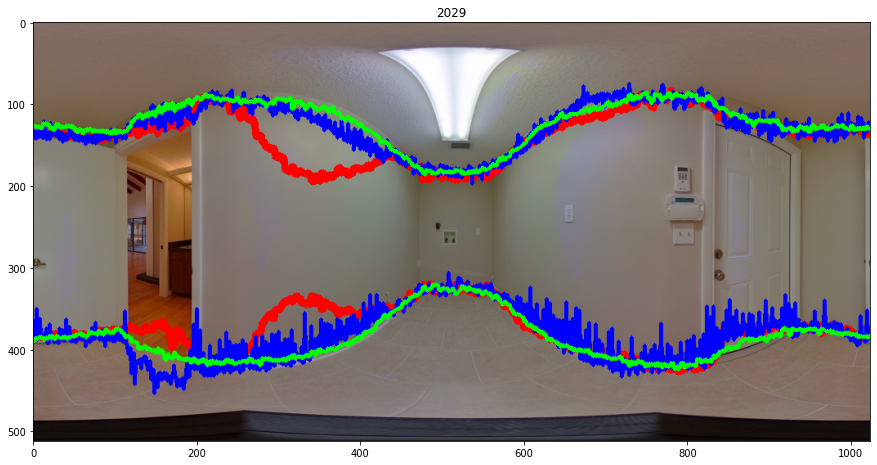

In [74]:
def show_zillow(x, gt_door, post_proc=False, save=False):   
    
    C, H, W = x.shape
    img_bon = x.numpy().transpose(1, 2, 0).copy() 
    radius = 1
    blue = (0, 0, 1)
    green = (0, 1, 0)
    red = (1, 0, 0)
    colors = [red, blue, green]
    thickness = [8, 4, 4]
    
    for i, net in enumerate(nets[:]):
        net.to('cuda')
        doornet.to('cuda')
        x = x.to('cuda')
        
        bon = net(x[None])
        bon = ((bon / 2 + 0.5) * H - 0.5)
        bon = bon.cpu().detach().numpy()
        bon_ori = bon[0].copy()
        

        if post_proc:
            y_bon_new = bon.copy()
            doorbar = torch.where(doornet(x[None])[0] > 0.3, 1., 0.).detach().cpu()
            diffs = np.diff(doorbar)
            starts = np.argwhere(diffs == 1).reshape(-1)
            stops = np.argwhere(diffs == -1).reshape(-1)

            if len(stops) > 0:
                if len(starts) < len(stops):
                    starts = np.concatenate([starts, np.array([0])])

                if stops[0] < starts[0]:
                    stops = np.concatenate([stops[1:], stops[:1]])

                for start, stop in zip(starts, stops):
                    p1 = np.array([start, y_bon_new[0, 0, start]])
                    p2 = np.array([stop, y_bon_new[0, 0, stop]])
                    new_bon = panostretch.pano_connect_points(p1, p2, z=-50)[1:-1, 1]
                    if start > stop:
                        y_bon_new[0, 0, start+1:], y_bon_new[0, 0, :stop] = np.split(new_bon, [1024-start-1,])

                    else:
                        y_bon_new[0, 0, start+1:stop] = new_bon

                    p1 = np.array([start, y_bon_new[0, 1, start]])
                    p2 = np.array([stop, y_bon_new[0, 1, stop]])
                    new_bon = panostretch.pano_connect_points(p1, p2, z=50)[1:-1, 1]
                    if start > stop:
                        y_bon_new[0, 1, start+1:], y_bon_new[0, 1, :stop] = np.split(new_bon, [1024-start-1,])

                    else:
                        y_bon_new[0, 1, start+1:stop] = new_bon
            
            bon = y_bon_new
            
#             ceiling_z = guess_ceiling(torch.Tensor(bon), H, W)

#             local_2d = compute_local(torch.Tensor(bon), H, W, ceiling_z[None])[0].detach().numpy()
#             ceiling = local_2d[:1024]
#             floor = local_2d[1024:]

            
#             epsilon = 0.008 * cv2.arcLength(floor,True)
#             floor_approx = cv2.approxPolyDP(floor,epsilon,True).reshape(-1, 2)
#             zs = np.ones((len(floor_approx), 1)) * -1
#             floor_approx = np.concatenate([floor_approx, zs], axis=-1)
#             floor_cor = TransformationSpherical.cartesian_to_pixel(torch.Tensor(floor_approx), W).numpy().astype(int)  
#             # floor_cor = np.roll(floor_cor[:, :2], -2 * np.argmin(floor_cor[::2, 0]), 0)
            
#             cor_col = floor_cor[:, 0]
#             postproc_cor = np.zeros((len(cor_col)*2, 2))
#             for j, col in enumerate(cor_col):
#                 postproc_cor[j*2] = col, bon[0, 0, col]
#                 postproc_cor[j*2+1] = col, bon[0, 1, col]
            # print(postproc_cor)
            
            
            # postproc_cor[:, 0] /= W
            # postproc_cor[:, 1] /= H
            
            # n_cor = len(postproc_cor)
            # for i in range(n_cor // 2):
            #     print(postproc_cor[(i*2+3) % n_cor])
            # print(cor_col, postproc_cor)
            # postproc_bon = cor_2_1d(postproc_cor, H, W)
            # postproc_bon = ((postproc_bon / 2 + 0.5) * H - 0.5)
            # bon = postproc_bon[None]
            
            # print(postproc_bon.shape)
        
            

        y_bon_draw = ((y_bon.numpy() / 2 + 0.5) * H - 0.5)
        bon = bon[0].round().astype(np.int32)
            
        if post_proc:
            # cor_id = postproc_cor
            cor = np.vstack([np.arange(1024), bon]).T
            cor_id = np.zeros((len(cor)*2, 2), np.float32)
            for j in range(len(cor)):
                cor_id[j*2] = cor[j, 0], cor[j, 1]
                cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]
        else:
            cor = np.vstack([np.arange(1024), bon]).T
            cor_id = np.zeros((len(cor)*2, 2), np.float32)
            for j in range(len(cor)):
                cor_id[j*2] = cor[j, 0], cor[j, 1]
                cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]

        true_eval = dict([
                            (n_corner, {'2DIoU': [], '3DIoU': [], 'rmse': [], 'delta_1': []})
                            for n_corner in ['4', '6', '8', '10+', 'odd', 'overall']
                        ])
        test_general(cor_id, gt_cor_id, 1024, 512, true_eval)

        # print(true_eval['overall']['3DIoU'][0])
        # # print(img_bon.dtype)
        # print(bon_ori, y_bon, postproc_bon)
        # print(img_bon, cor_id)
        
        cor = np.vstack([np.arange(1024), bon_ori]).T
        cor_id = np.zeros((len(cor)*2, 2), np.float32)
        for j in range(len(cor)):
            cor_id[j*2] = cor[j, 0], cor[j, 1]
            cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]

        cv2.polylines(img_bon, [cor_id[::2].reshape(-1, 1, 2).astype(int)],  
                      False, colors[i],  
                      thickness[i]) 
        cv2.polylines(img_bon, [cor_id[1::2].reshape(-1, 1, 2).astype(int)],  
                      False, colors[i],  
                      thickness[i]) 
        
#         for i, draw_bon in enumerate([y_bon_draw, bon_ori]):
#             cor = np.vstack([np.arange(1024), draw_bon]).T
#             cor_id = np.zeros((len(cor)*2, 2), np.float32)
#             for j in range(len(cor)):
#                 cor_id[j*2] = cor[j, 0], cor[j, 1]
#                 cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]
                
#             cv2.polylines(img_bon, [cor_id[::2].reshape(-1, 1, 2).astype(int)],  
#                           False, colors[i],  
#                           thickness[i]) 
#             cv2.polylines(img_bon, [cor_id[1::2].reshape(-1, 1, 2).astype(int)],  
#                           False, colors[i],  
#                           thickness[i]) 
        
        
        
#         for col in range(W):            
#             coord = (col, int(bon_ori[0, col]))
#             cv2.circle(img_bon, coord, radius, green, thickness)
            
#             coord = (col, int(bon_ori[1, col]))
#             cv2.circle(img_bon, coord, radius, green, thickness)
            
            
#             coord = (col, int(y_bon_draw[0, col]))
#             cv2.circle(img_bon, coord, radius, red, thickness)
            
#             coord = (col, int(y_bon_draw[1, col]))
#             cv2.circle(img_bon, coord, radius, red, thickness)
            
#             if post_proc:
#                 coord = (col, int(bon[0, col]))
#                 cv2.circle(img_bon, coord, radius, blue, thickness)
                
#                 coord = (col, int(bon[1, col]))
#                 cv2.circle(img_bon, coord, radius, blue, thickness)



        # print(bon)

        # y1 = np.round(bon[0]).astype(int)
        # y2 = np.round(bon[1]).astype(int)
        # y1 = np.vstack([np.arange(1024), y1]).T.reshape(-1, 1, 2)
        # y2 = np.vstack([np.arange(1024), y2]).T.reshape(-1, 1, 2)

          
        # img_bon[bon[0], np.arange(len(bon[0])), i+1] = 1.
        # img_bon[bon[1], np.arange(len(bon[1])), i+1] = 1.
    # black = np.zeros((5, 1024, 3))
    # white = np.ones((5, 1024, 3))
    # doorbar = doorbar.expand(3, 30, 1024).permute(1, 2, 0).numpy()
    # gt_door = gt_door.expand(3, 30, 1024).permute(1, 2, 0).numpy()
    # img_bon = np.concatenate([black, gt_door, black, doorbar, black, img_bon], axis=0).copy()
    
    
    plt.figure(figsize=(15, 10))
    plt.title(ith)
    plt.imshow(img_bon)
    
    # plt.figure(figsize=(15, 10))
    # plt.scatter(floor[:, 0], floor[:, 1])
    global num_saved
    
    score = true_eval['overall']['3DIoU'][0]
    n_cor = len(gt_cor_id) // 2
    
    if save and score > 0.7:
        # if score > 0.7:
        #     if n_cor > 4:
        #         save_dir = './pics/qualitatives/zillow/excellent/advanced'
        #     else:
        #         save_dir = './pics/qualitatives/zillow/excellent/basic'
        # else:
        #     if n_cor > 4:
        #         save_dir = './pics/qualitatives/zillow/normal/advanced'
        #     else:
        #         save_dir = './pics/qualitatives/zillow/normal/basic'
        if n_cor > 4:
            save_dir = './pics/qualitatives/zillow/advanced'
        else:
            save_dir = './pics/qualitatives/zillow/basic'
        save_dir = './pics/ablation'
        filename = os.path.join(save_dir, f'{ith}.jpg')
        cv2.imwrite(filename, (img_bon[:, :, ::-1] * 255).astype(int))
        # print(filename, 'saved!')
        num_saved += 1

dataset = zillow
# iths = np.random.choice(len(dataset), 5)
# iths = np.arange(len(dataset))
# iths = [330, 401, 871, 1409, 1533, 1548, 1858, 1947, 1970, 1996, 2422, 2791]
# iths = [1189]
iths = [1571, 206, 959, 1314, 2029]
num_saved = 0
# iths = [206]

for ith in tqdm(iths):
# while len(os.listdir('./pics/qualitatives/zillow/excellent/advanced')) < 20:
    # print(ith)
    # ith = np.random.randint(len(dataset))
    x, y_bon, y_cor, gt_cor_id = dataset[ith]
    # _, doorbar_ = door_dataset[ith]
    doorbar_ = None
    
    # show_zillow(x, doorbar_, post_proc=True)
    # show_zillow(x, doorbar_, post_proc=False)
    show_zillow(x, doorbar_, post_proc=False, save=True)

    # for net in nets[1:]:
    #     show(net, x)
print(f'{num_saved} pics saved')

In [5]:
img_path

'/mnt/home_6T/sunset/zind/0728/panos/floor_01_partial_room_12_pano_33.jpg'

# Show MP3D

In [26]:
def show_mp3d(x, save=False):   
    
    C, H, W = x.shape
    img_bon = x.numpy().transpose(1, 2, 0).copy() 
    # img_bon = cv2.cvtColor(img_bon, cv2.COLOR_RGB2HLS)
    # img_bon[:, :, 2] *= saturation
    # img_bon = cv2.cvtColor(img_bon, cv2.COLOR_HLS2RGB)
    
    radius = 1
    blue = (0, 0, 1)
    green = (0, 1, 0)
    red = (1, 0, 0)
    colors = [blue, green]
    thickness = [4, 4]
    
    y_bon_for_draw = ((y_bon / 2 + 0.5) * H - 0.5)
    gt_cor = np.vstack([np.arange(1024), y_bon_for_draw]).T
    gt_cor_id_for_draw = np.zeros((len(gt_cor)*2, 2), np.float32)
    for j in range(len(gt_cor)):
        gt_cor_id_for_draw[j*2] = gt_cor[j, 0], gt_cor[j, 1]
        gt_cor_id_for_draw[j*2 + 1] = gt_cor[j, 0], gt_cor[j, 2]
    
    cv2.polylines(img_bon, [gt_cor_id_for_draw[::2].reshape(-1, 1, 2).astype(int)],  
                      False, red, 8) 
    cv2.polylines(img_bon, [gt_cor_id_for_draw[1::2].reshape(-1, 1, 2).astype(int)],  
                      False, red, 8) 
    
    scores = []
    
    for i, net in enumerate(nets[1:]):
        # net.to('cuda')
        # doornet.to('cuda')
        # x = x.to('cuda')
        
        bon = net(x[None])
        
        score = F.l1_loss(y_bon, bon)
        
        bon = ((bon / 2 + 0.5) * H - 0.5)
        bon = bon.cpu().detach().numpy()

        y_bon_draw = ((y_bon.numpy() / 2 + 0.5) * H - 0.5)
        bon = bon[0].round().astype(np.int32)

        cor = np.vstack([np.arange(1024), bon]).T
        cor_id = np.zeros((len(cor)*2, 2), np.float32)
        for j in range(len(cor)):
            cor_id[j*2] = cor[j, 0], cor[j, 1]
            cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]
        # true_eval = dict([
        #                     (n_corner, {'2DIoU': [], '3DIoU': [], 'rmse': [], 'delta_1': []})
        #                     for n_corner in ['4', '6', '8', '10+', 'odd', 'overall']
        #                 ])
        # test_general(cor_id, gt_cor_id, 1024, 512, true_eval)
        
        # print(true_eval['overall']['3DIoU'][0], i)
        scores.append(score)
        
        # for i, draw_bon in enumerate([y_bon_draw, bon_ori, bon]):
            # cor = np.vstack([np.arange(1024), draw_bon]).T
            # cor_id = np.zeros((len(cor)*2, 2), np.float32)
            # for j in range(len(cor)):
            #     cor_id[j*2] = cor[j, 0], cor[j, 1]
            #     cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]
                
        cv2.polylines(img_bon, [cor_id[::2].reshape(-1, 1, 2).astype(int)],  
                      False, colors[i],  
                      thickness[i]) 
        cv2.polylines(img_bon, [cor_id[1::2].reshape(-1, 1, 2).astype(int)],  
                      False, colors[i],  
                      thickness[i]) 
        
        # for col in range(W):            
        #     coord = (col, int(bon[0, col]))
        #     cv2.circle(img_bon, coord, radius, colors[i], thickness)            
        #     coord = (col, int(bon[1, col]))
        #     cv2.circle(img_bon, coord, radius, colors[i], thickness)           
        #     coord = (col, int(y_bon_draw[0, col]))
        #     cv2.circle(img_bon, coord, radius, red, thickness)            
        #     coord = (col, int(y_bon_draw[1, col]))
        #     cv2.circle(img_bon, coord, radius, red, thickness)

    
    
    # plt.figure(figsize=(15, 10))
    # plt.imshow(img_bon)
    
    # plt.figure(figsize=(15, 10))
    # plt.scatter(floor_cor[:, 0], floor_cor[:, 1])
    global num_saved
    
    # score = true_eval['overall']['3DIoU'][0]
    n_cor = len(gt_cor_id) // 2
    
    # print(scores)
    
    if save and scores[1] < 0.05:
        if n_cor > 4:
            save_dir = './pics/qualitatives/mp3d_100/advanced'
        else:
            save_dir = './pics/qualitatives/mp3d_100/basic'
        
        # save_dir = './pics/qualitatives/mp3d_all'
        improve = int((scores[0]-scores[1]) * 1000)
        if improve > 10:
            filename = os.path.join(save_dir, f'L1_{ith}_{improve}.jpg')
            cv2.imwrite(filename, (img_bon[:, :, ::-1] * 255).astype(int))
            # print(filename, 'saved!')
            num_saved += 1

dataset = mp3d
# iths = np.random.choice(len(dataset), 1)
iths = np.arange(len(dataset))
# iths = [85, 88, 89,  91, 99, 104, 116, 122]
# iths = [1, 21, 97, 126, 158, 165, 170, 183]
# iths = [88]
num_saved = 0
saturation = 1.0
# iths = [206]

for ith in tqdm(iths):
# while len(os.listdir('./pics/qualitatives/zillow/excellent/advanced')) < 20:
    # print(ith)
    # ith = np.random.randint(len(dataset))
    x, y_bon, y_cor, gt_cor_id = dataset[ith]
    
    # show_mp3d(x)
    show_mp3d(x, save=True)
    # show_zillow(x, post_proc=False, save=True)

    # for net in nets[1:]:
    #     show(net, x)
print(f'{num_saved} pics saved')

  0%|                                                                                                                                                               | 0/187 [00:00<?, ?it/s]/tmp/ipykernel_5607/293556437.py:37: UserWarning: Using a target size (torch.Size([1, 2, 1024])) that is different to the input size (torch.Size([2, 1024])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  score = F.l1_loss(y_bon, bon)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 187/187 [04:39<00:00,  1.50s/it]

26 pics saved


In [19]:
scores

NameError: name 'scores' is not defined

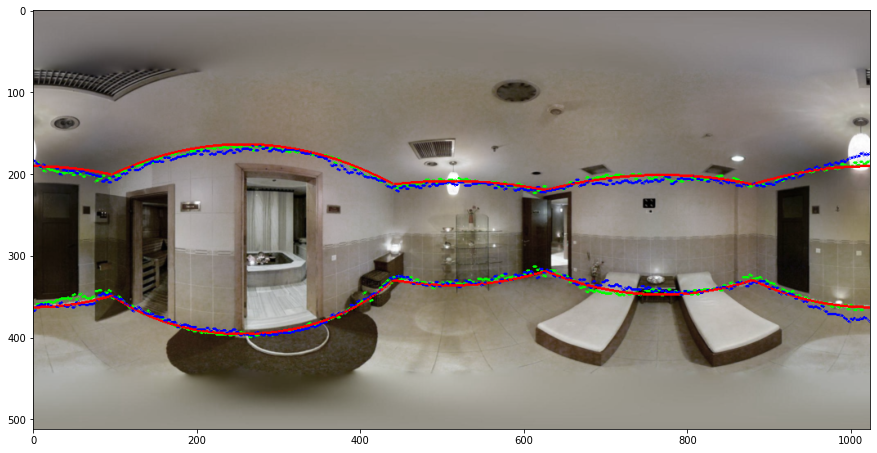

In [147]:
saturation = 0.5
show_mp3d(x)

In [13]:
def my_cor_2_1d(cor, H, W):
    bon_ceil_x, bon_ceil_y = [], []
    bon_floor_x, bon_floor_y = [], []
    n_cor = len(cor)
    print(n_cor)
    for i in range(n_cor // 2):
        xys = panostretch.pano_connect_points(cor[i*2],
                                              cor[(i*2+2) % n_cor],
                                              z=-50, w=W, h=H)
        bon_ceil_x.extend(xys[:, 0])
        bon_ceil_y.extend(xys[:, 1])
        print(xys, cor[i*2], cor[(i*2+2) % n_cor])
    for i in range(n_cor // 2):
        xys = panostretch.pano_connect_points(cor[i*2+1],
                                              cor[(i*2+3) % n_cor],
                                              z=50, w=W, h=H)
        bon_floor_x.extend(xys[:, 0])
        bon_floor_y.extend(xys[:, 1])
        
    bon = np.zeros((2, W))
    print(bon_ceil_x, bon_ceil_y)
    
    bon_ceil_x, bon_ceil_y = sort_xy_filter_unique(bon_ceil_x, bon_ceil_y, y_small_first=True)
    bon[0] = np.interp(np.arange(W), bon_ceil_x, bon_ceil_y, period=W)
    
    bon_floor_x, bon_floor_y = sort_xy_filter_unique(bon_floor_x, bon_floor_y, y_small_first=False)
    bon[1] = np.interp(np.arange(W), bon_floor_x, bon_floor_y, period=W)       
    
    # bon = ((bon + 0.5) / H - 0.5) * np.pi
    bon = ((bon + 0.5) / H - 0.5) * 2
    return bon

In [347]:
a = np.array([120, 250])
b = np.array([620, 250])
panostretch.pano_connect_points(a, b, z=-1).shape

(501, 2)

In [214]:
len(dataset_zillow)

2830

In [11]:
original = HorizonNet('resnet50', True)
original.load_state_dict(torch.load('./ckpt/semi_sup01/best_valid_1.pth')['state_dict'])
# original.load_state_dict(torch.load('./ckpt/ceilfloor/best.pth')['state_dict'])

<All keys matched successfully>

In [3]:
train_dataset = ZillowIndoorPairDataset(
        root_dir='/mnt/home_6T/sunset/zind', subject='train', stretch=True)
len(train_dataset)

11598

In [ ]:
idx = np.random.randint(len(dataset))
idx

In [ ]:
target_img[None].shape

In [ ]:
net(src_img[None]).shape

In [ ]:
a = torch.zeros(1, 1024, 2) 
b = torch.zeros(1, 1024)
torch.cat([a, b[:, :, None]], axis=-1).shape

In [15]:
(torch.arange(1024).expand(2, 2, 1024))

tensor([[[   0,    1,    2,  ..., 1021, 1022, 1023],
         [   0,    1,    2,  ..., 1021, 1022, 1023]],

        [[   0,    1,    2,  ..., 1021, 1022, 1023],
         [   0,    1,    2,  ..., 1021, 1022, 1023]]])

In [10]:
src_bon = torch.randn(2, 2, 1024)
torch.stack([(torch.ones(src_bon.shape) * torch.arange(1024)).to(src_bon.device), src_bon], axis=-1).shape

torch.Size([2, 2, 1024, 2])

In [ ]:
idx = np.random.randint(len(dataset))
# idx = 160
print(idx)

src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation = dataset[idx]
src_transformer = Transformation2D(rotation_matrix=src_rotation_matrix, scale=src_scale, translation=src_translation)
target_transformer = Transformation2D(rotation_matrix=target_rotation_matrix, scale=target_scale, translation=target_translation)
_, H, W = src_img.shape
y_bon_ori = net(target_img[None])[0]
# y_bon = torch.Tensor(cor_2_1d(txts[0], H, W))[1]
y_bon = torch.nan_to_num(torch.clip((y_bon_ori / np.pi + 0.5) * (H-1), H/2+1, H-1))
y_bon_src = net(src_img[None])[0]
y_bon_src = torch.nan_to_num(torch.clip((y_bon_src / np.pi + 0.5) * (H-1), H/2+1, H-1))


grid = warp_index(src_transformer, target_transformer, y_bon, 256, 480, H, W)
warp_img = F.grid_sample(src_img[None], grid[None])[0]



cat_img = torch.cat([target_img[:, :256, :], warp_img, target_img[:, 480:, :]], dim=1)
pseudo_y_bon_ori = net(cat_img[None])[0]
pseudo_y_bon = torch.nan_to_num(torch.clip((pseudo_y_bon_ori / np.pi + 0.5) * (H-1), H/2+1, H-1))

ph_loss = torch.nn.MSELoss()(target_img[:, 256:480], warp_img)
bon_loss = torch.nn.MSELoss()(y_bon_ori, pseudo_y_bon_ori)
# bon_loss.backward()
# chamfer_loss = compute_chamfer(chamferDist, y_bon_src[None], src_transformer, y_bon[None], target_transformer)
# loss = chamfer_loss
# loss.backward()
print(ph_loss)

target_img = target_img.detach().numpy().transpose(1, 2, 0).copy()
radius = 1
color = (0, 0, 255)
thickness = 1
for col in range(1024):
    coord = (col, int(y_bon[col].item()))
    cv2.circle(target_img, coord, radius, color, thickness)

cat_img = cat_img.detach().numpy().transpose(1, 2, 0).copy()
radius = 1
color = (0, 0, 255)
thickness = 1
for col in range(1024):
    coord = (col, int(pseudo_y_bon[col].item()))
    cv2.circle(cat_img, coord, radius, color, thickness)    
    
plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(src_img.detach().permute(1, 2, 0)[256:480])
# plt.imshow(src_img.detach().permute(1, 2, 0))
plt.figure(figsize=(15,10))
plt.title('warped image')
plt.imshow(cat_img[256:480])
# plt.imshow(cat_img)
# plt.imshow(cat_img.detach().permute(1, 2, 0))
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_img[256:480])
# plt.imshow(target_img)

In [ ]:
def inference(net, x, device, flip=False, rotate=[], visualize=False,
              force_raw=True, force_cuboid=True, min_v=None, r=0.05):
    '''
    net   : the trained HorizonNet
    x     : tensor in shape [1, 3, 512, 1024]
    flip  : fliping testing augmentation
    rotate: horizontal rotation testing augmentation
    '''

    H, W = tuple(x.shape[2:])

    # Network feedforward (with testing augmentation)
    # x, aug_type = augment(x, flip, rotate)
    # y_bon_, y_cor_ = net(x.to(device))
    
    y_bon_ = net(x.to(device))
    # y_bon_ = augment_undo(y_bon_.cpu(), aug_type).mean(0)
    # y_cor_ = augment_undo(torch.sigmoid(y_cor_).cpu(), aug_type).mean(0)

    # Visualize raw model output
    if visualize:
        vis_out = visualize_a_data(x[0],
                                   torch.FloatTensor(y_bon_[0]),
                                   torch.FloatTensor(y_cor_[0]))
    else:
        vis_out = None

    y_bon_ = (y_bon_[0] / np.pi + 0.5) * H - 0.5
    y_bon_ = y_bon_.detach().numpy()
    # y_cor_ = y_cor_[0, 0]

    # Init floor/ceil plane
    z0 = 50
    # _, z1 = post_proc.np_refine_by_fix_z(*y_bon_, z0)
    z1 = 0

    # Detech wall-wall peaks
    if min_v is None:
        min_v = 0 if force_cuboid else 0.05
    r = int(round(W * r / 2))
    N = 4 if force_cuboid else None
    # xs_ = find_N_peaks(y_cor_, r=r, min_v=min_v, N=N)[0]

    # Generate wall-walls
    if force_raw:
        
        cor = np.stack([np.arange(1024), y_bon_], 1)

    else:
        cor, xy_cor = post_proc.gen_ww(xs_, y_bon_[0], z0, tol=abs(0.16 * z1 / 1.6), force_cuboid=force_cuboid)
        if not force_cuboid:
            # Check valid (for fear self-intersection)
            xy2d = np.zeros((len(xy_cor), 2), np.float32)
            for i in range(len(xy_cor)):
                xy2d[i, xy_cor[i]['type']] = xy_cor[i]['val']
                xy2d[i, xy_cor[i-1]['type']] = xy_cor[i-1]['val']
            if not Polygon(xy2d).is_valid:
                print(
                    'Fail to generate valid general layout!! '
                    'Generate cuboid as fallback.',
                    file=sys.stderr)
                xs_ = find_N_peaks(y_cor_, r=r, min_v=0, N=4)[0]
                cor, xy_cor = post_proc.gen_ww(xs_, y_bon_[0], z0, tol=abs(0.16 * z1 / 1.6), force_cuboid=True)

    # Expand with btn coory
    # cor = np.hstack([cor, post_proc.infer_coory(cor[:, 1], z1 - z0, z0)[:, None]])

    # Collect corner position in equirectangular
    cor_id = np.zeros((len(cor), 2), np.float32)
    for j in range(len(cor)):
        # cor_id[j*2] = cor[j, 0], cor[j, 1]
        # cor_id[j*2 + 1] = cor[j, 0], cor[j, 2]
        cor_id[j] = cor[j, 0], cor[j, 1]

    # Normalized to [0, 1]
    cor_id[:, 0] /= W
    cor_id[:, 1] /= H

    return cor_id, z0, z1, vis_out

In [ ]:
def test_general(dt_cor_id, gt_cor_id, w, h, losses):
#     dt_floor_coor = dt_cor_id[1::2]
#     dt_ceil_coor = dt_cor_id[0::2]
    gt_floor_coor = gt_cor_id[1::2]
    gt_ceil_coor = gt_cor_id[0::2]
#     assert (dt_floor_coor[:, 0] != dt_ceil_coor[:, 0]).sum() == 0
#     assert (gt_floor_coor[:, 0] != gt_ceil_coor[:, 0]).sum() == 0

    dt_floor_coor = dt_cor_id
#     gt_floor_coor = gt_cor_id

    # Eval 3d IoU and height error(in meter)
    N = len(dt_floor_coor)
    ch = -1.6
    dt_floor_xy = post_proc.np_coor2xy(dt_floor_coor, ch, 1024, 512, floorW=1, floorH=1)
    gt_floor_xy = post_proc.np_coor2xy(gt_floor_coor, ch, 1024, 512, floorW=1, floorH=1)
    dt_poly = Polygon(dt_floor_xy)
    gt_poly = Polygon(gt_floor_xy)
    if not gt_poly.is_valid:
        if 'gt_path' in locals():
            print('Skip ground truth invalid (%s)' % gt_path)
        return

    # 2D IoU
    try:
        area_dt = dt_poly.area
        area_gt = gt_poly.area
        area_inter = dt_poly.intersection(gt_poly).area
        iou2d = area_inter / (area_gt + area_dt - area_inter)
    except:
        iou2d = 0

    # 3D IoU
#     try:
#         cch_dt = post_proc.get_z1(dt_floor_coor[:, 1], dt_ceil_coor[:, 1], ch, 512)
#         cch_gt = post_proc.get_z1(gt_floor_coor[:, 1], gt_ceil_coor[:, 1], ch, 512)
#         h_dt = abs(cch_dt.mean() - ch)
#         h_gt = abs(cch_gt.mean() - ch)
#         area3d_inter = area_inter * min(h_dt, h_gt)
#         area3d_pred = area_dt * h_dt
#         area3d_gt = area_gt * h_gt
#         iou3d = area3d_inter / (area3d_pred + area3d_gt - area3d_inter)
#     except:
#         iou3d = 0

#     # rmse & delta_1
#     gt_layout_depth = layout_2_depth(gt_cor_id, h, w)
#     try:
#         dt_layout_depth = layout_2_depth(dt_cor_id, h, w)
#     except:
#         dt_layout_depth = np.zeros_like(gt_layout_depth)
#     rmse = ((gt_layout_depth - dt_layout_depth)**2).mean() ** 0.5
#     thres = np.maximum(gt_layout_depth/dt_layout_depth, dt_layout_depth/gt_layout_depth)
#     delta_1 = (thres < 1.25).mean()

    # Add a result
    n_corners = len(gt_floor_coor)
    if n_corners % 2 == 1:
        n_corners = 'odd'
    elif n_corners < 10:
        n_corners = str(n_corners)
    else:
        n_corners = '10+'
    losses[n_corners]['2DIoU'].append(iou2d)
#     losses[n_corners]['3DIoU'].append(iou3d)
#     losses[n_corners]['rmse'].append(rmse)
#     losses[n_corners]['delta_1'].append(delta_1)
    losses['overall']['2DIoU'].append(iou2d)
#     losses['overall']['3DIoU'].append(iou3d)
#     losses['overall']['rmse'].append(rmse)
#     losses['overall']['delta_1'].append(delta_1)

In [ ]:
for p in net.parameters():
    if p.grad is not None:
        print(p.grad)

In [ ]:
idx = 150
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation = dataset[idx]
cor_id = inference(net, target_img[None], 'cpu')[0]

In [ ]:
cor_id[:, 1] * 512

In [ ]:
x, bon, y_cor = test_dataset[idx]

In [5]:
loader = DataLoader(dataset, 2)

In [6]:
it = iter(loader)

In [7]:
len(dataset)

750

In [ ]:
view_img, batch_view_rotation_matrix, batch_view_scale, batch_view_translation, batch_proj_img, batch_proj_rotation_matrix, batch_proj_scale, batch_proj_translation = it


In [6]:
device = 'cpu'

In [5]:
def compute_global(src_bon, src_transformer, target_bon, target_transformer, H, W, ceiling_z):
    N, C, _ = src_bon.shape
    theta = ((torch.arange(W).expand(N, C, W).to(device) / W)) * 2 * np.pi #(N, 2, 1024)

    
    z_bons = torch.cat([ceiling_z, torch.zeros_like(ceiling_z) - 1.], dim=-1)
    src_phi = (0.5 - (src_bon / H)) * np.pi # (N, 2, 1024)
    src_dist = z_bons[:, :, None] / torch.tan(src_phi) # (N, 2, 1024)
    src_x = src_dist * torch.sin(theta) # (N, 2, 1024)
    src_y = src_dist * torch.cos(theta + np.pi) # (N, 2, 1024)
    src_z = torch.zeros(src_bon.shape) - 1. # (N, 2, 1024)
    src_local_2d = torch.stack([src_x, src_y], axis=-1).view(N, -1, 2) # (N, 2*1024, 2)
    src_global_2d = src_transformer.to_global(src_local_2d) # (N, 2*1024, 2)
    
    target_phi = (0.5 - (target_bon / H)) * np.pi # (N, 2, 1024)
    target_dist = z_bons[:, :, None] / torch.tan(target_phi) # (N, 2, 1024)
    target_x = target_dist * torch.sin(theta) # (N, 2, 1024)
    target_y = target_dist * torch.cos(theta + np.pi) # (N, 2, 1024)
    target_z = torch.zeros(target_bon.shape) - 1. # (N, 2, 1024)
    target_local_2d = torch.stack([target_x, target_y], axis=-1).view(N, -1, 2) # (N, 2*1024, 2)
    target_global_2d = target_transformer.to_global(target_local_2d) # (N, 2*1024, 2)

    
    return src_global_2d, target_global_2d
       
# compute_chamfer(chamferDist, y_bon_src[None], src_transformer, y_bon[None], target_transformer)

In [8]:
# batch version
def warp_index(src_transformer, target_transformer, target_bon, H, W, ceiling_z): 
    N = target_bon.shape[0]    # (N, 2, 1024)
    
    theta = ((torch.arange(W).expand(N, W) / W)) * 2 * np.pi # (N, 1024)
    target_3d_coord = []
    
    z_bons = [ceiling_z, torch.zeros_like(ceiling_z) - 1.] # (N, 1)
    for i, z_bon in enumerate(z_bons):
        y_start = (H // 2) * i
        y_end = y_start + (H // 2)
        
        y_grid, x_grid = torch.meshgrid(torch.arange(y_start, y_end), torch.arange(W))    
        y_grid, x_grid = y_grid.expand(N, H//2, W), x_grid.expand(N, H//2, W)    # (N, 256, 1024)
        
        boundary_phi = (0.5 - (target_bon[:, i] / H)) * np.pi # (N, 1024)
        boundary_dist = torch.abs(z_bon / torch.tan(boundary_phi)) # (N, 1024)

        boundary_x = boundary_dist * torch.sin(theta) # (N, 1024)
        boundary_y = boundary_dist * torch.cos(theta + np.pi) # (N, 1024)
        boundary_R = torch.abs(z_bon / torch.sin(boundary_phi))  # (N, 1024)

        all_phi = (0.5 - (y_grid / H)) * np.pi # (N, 256, 1024)
        all_dist = torch.min(torch.abs(1 / torch.tan(all_phi)), boundary_dist[:, None, :]) # (N, 256, 1024)
        all_x = all_dist * torch.sin(theta[:, None, :]) # (N, 256, 1024)
        all_y = all_dist * torch.cos(theta[:, None, :] + np.pi) # (N, 256, 1024)
        # all_z = torch.clamp(boundary_R * torch.sin(all_phi), -1., height) # (N, 256, 1024)     
        all_z = torch.max(torch.min(boundary_R[:, None, :] * torch.sin(all_phi), ceiling_z[:, :, None]), torch.Tensor([-1.]))

        target_3d_coord.append(torch.stack([all_x, all_y, all_z], dim=-1).view(N, -1, 3))    # (N, 256*1024, 3)
    

    target_3d_coord = torch.cat(target_3d_coord, dim=1) # (N, 512*1024, 3)
    global_2d_coord = target_transformer.to_global(target_3d_coord[:, :, :2]) # (N, 512*1024, 2)
    

    src_2d_coord = src_transformer.apply_inverse(global_2d_coord) # (N, 512*1024, 2)
    src_3d_coord = torch.cat([src_2d_coord, target_3d_coord[:, :, 2:]], dim=-1).view(-1, 3) # (N*512*1024, 3)

    src_pix_coord = TransformationSpherical.cartesian_to_pixel(src_3d_coord, W) # (N*512*1024, 2)
    
    src_x_grid = ((src_pix_coord[:, 0] / W - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    src_y_grid = ((src_pix_coord[:, 1] / H - 0.5) * 2).view(N, H, W) # (N, 512, 1024)
    
    grid = torch.stack([src_x_grid, src_y_grid], axis=-1)    # (N, 512, 1024, 2)
    
    return grid  
# grid = feed_forward(net, criterion, params)

# Feed Forward

In [122]:
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, stretched_src_img, stretched_target_img, stretch_k, ceiling_height = params

In [25]:
# a = torch.Tensor([0., 0.])
# b = torch.Tensor([0., 2.])
a = torch.randn(4, 6)
b = torch.randn(4, 6)
# torch.logical_or(a, b).float()
c = nn.MSELoss(reduction='none')
c(a, b).shape

torch.Size([4, 6])

tensor([[[-0.5134, -0.5089, -0.5162,  ..., -0.5438, -0.5410, -0.5382],
         [ 0.6298,  0.6269,  0.6284,  ...,  0.6512,  0.6470,  0.6451]],

        [[-0.5341, -0.5295, -0.5303,  ..., -0.5351, -0.5365, -0.5353],
         [ 0.6535,  0.6490,  0.6483,  ...,  0.6505,  0.6518,  0.6519]]],
       grad_fn=<MulBackward0>)
torch.Size([2, 1])
tensor(-0.0719, grad_fn=<MeanBackward0>)
****************************************************************************************************


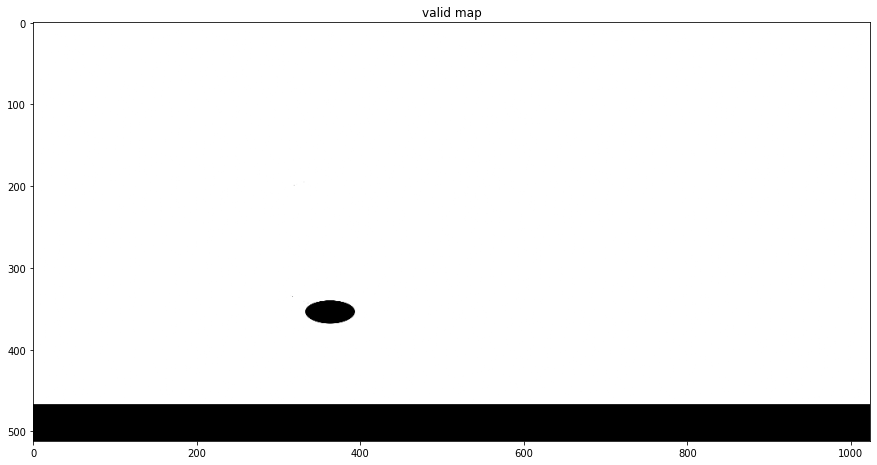

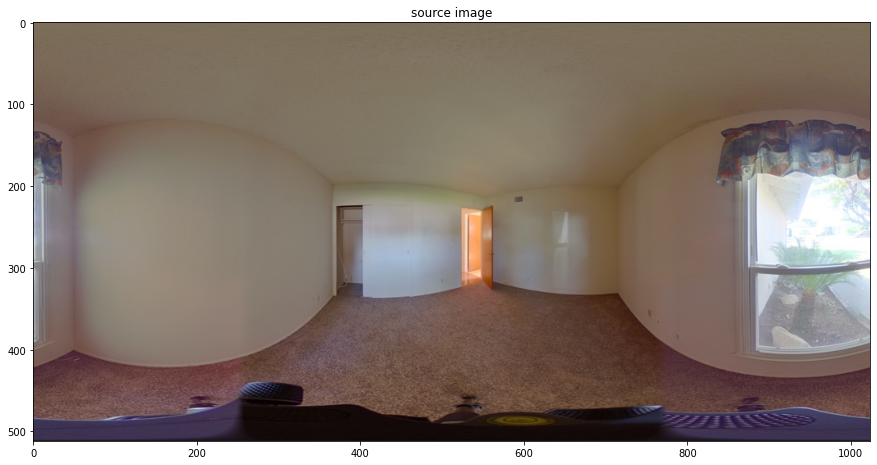

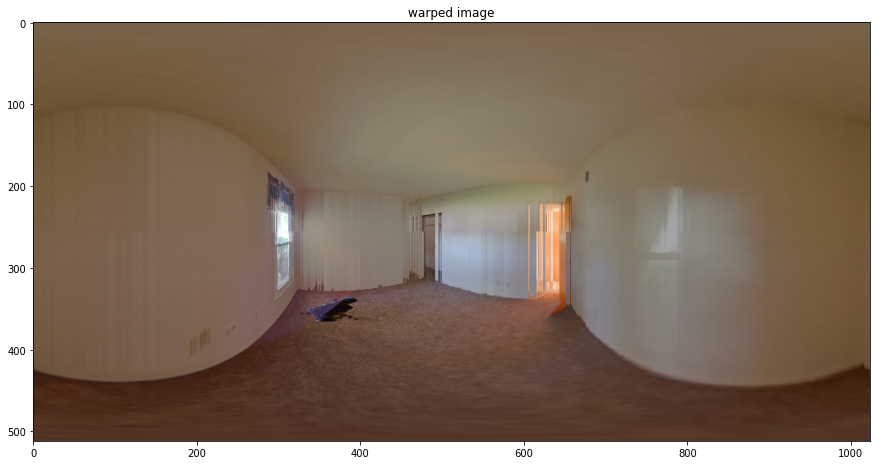

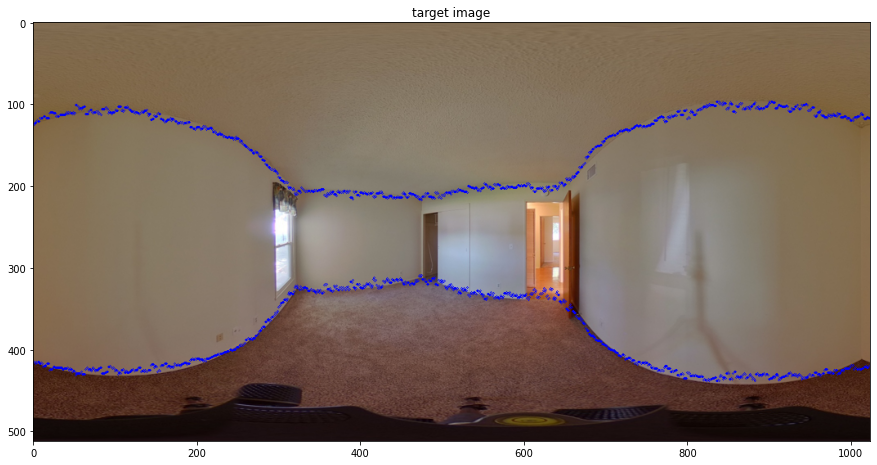

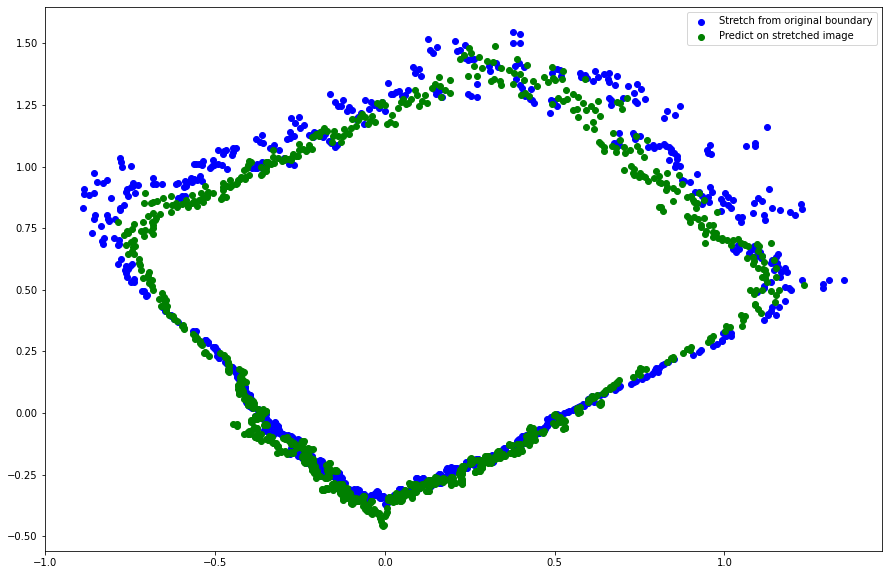

...

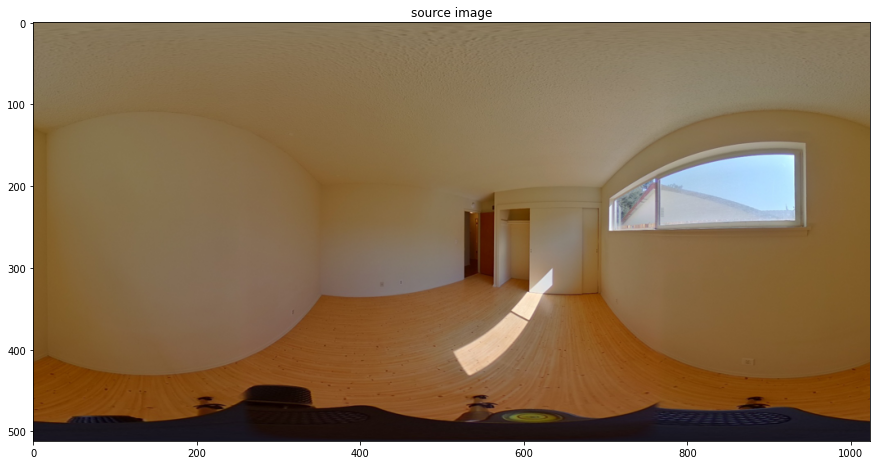

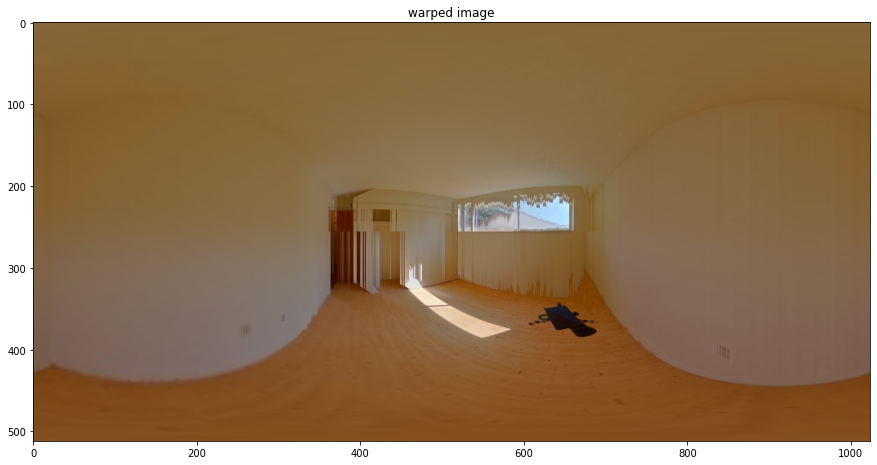

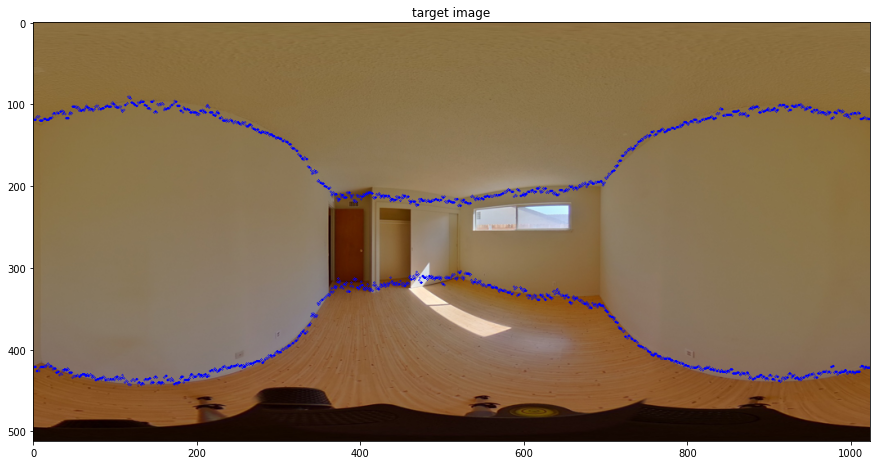

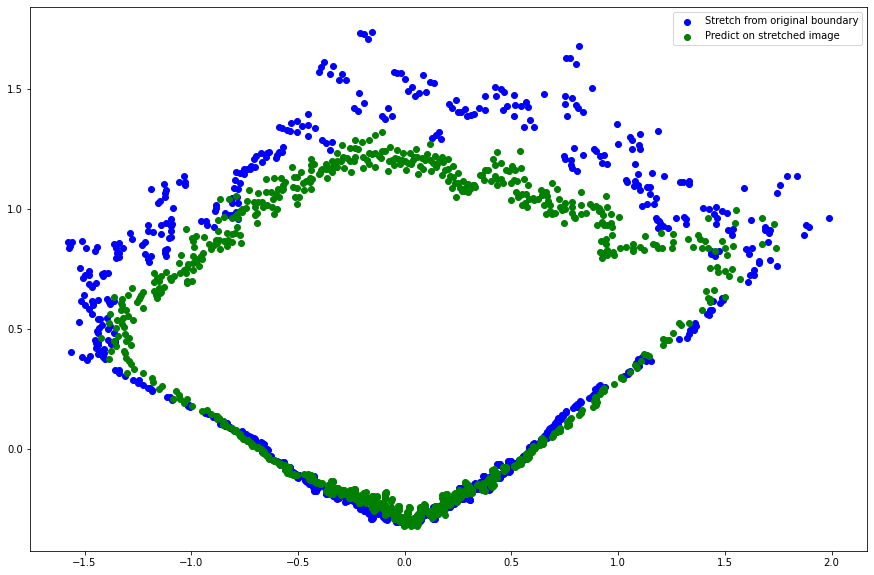

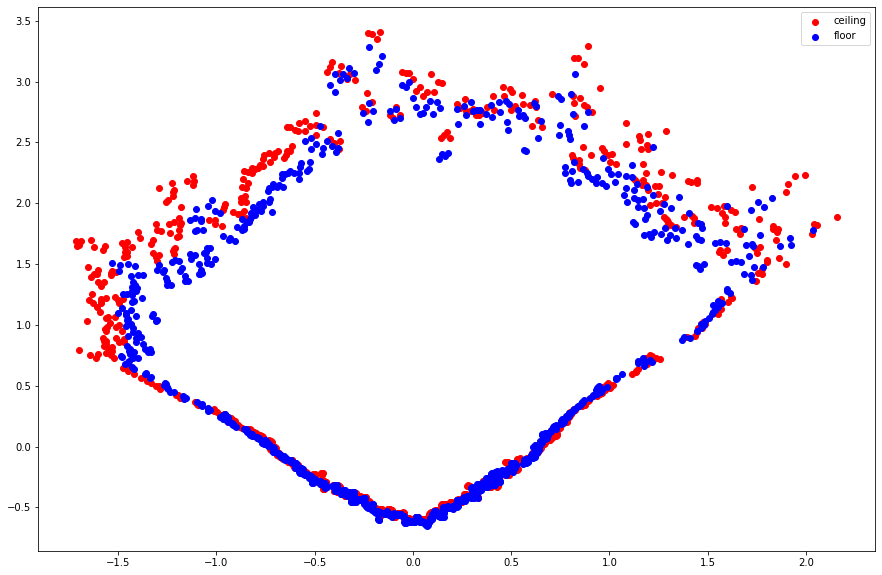

In [74]:
def feed_forward(net, criterion, params, single=False):

    src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, stretched_src_img, stretched_target_img, stretch_k, ceiling_height = params
    if single:
        src_img = src_img[None]
        src_rotation_matrix = src_rotation_matrix[None]
        src_scale = src_scale[None]
        src_translation = src_translation[None]
        target_img = target_img[None]
        target_rotation_matrix = target_rotation_matrix[None]
        target_scale = target_scale[None]
        target_translation = target_translation[None]
        stretched_src_img = stretched_src_img[None]
        stretched_target_img = stretched_target_img[None]
        stretch_k = stretch_k[None]
    
    src_img = src_img.to(device)
    src_rotation_matrix = src_rotation_matrix.to(device)
    src_scale = src_scale.to(device)
    src_translation = src_translation.to(device)
    target_img = target_img.to(device)
    target_rotation_matrix = target_rotation_matrix.to(device)
    target_scale = target_scale.to(device)
    target_translation = target_translation.to(device)
    stretched_src_img = stretched_src_img.to(device)
    stretch_k = stretch_k.to(device)
    
    criterion = criterion.to(device)
    
    # kx, ky = 3, 1
    # target_img, _ = panostretch.pano_stretch(target_img, target_cor, kx, ky)

    N, C, H, W = src_img.shape

    y_bon_ori = net(target_img)
    print(y_bon_ori)
    print(ceiling_height.shape)
    y_bon = (y_bon_ori / 2 + 0.5) * H - 0.5
    #_bon = torch.nan_to_num(torch.clamp(y_bon, 0, H-1))
    y_bon = torch.clamp(y_bon, 0, H-1)

    y_bon_src = net(src_img)
    #_bon_src = torch.nan_to_num(torch.clip((y_bon_src / np.pi + 0.5) * (H-1), 0, H-1))
    y_bon_src = torch.clip((y_bon_src / 2 + 0.5) * (H-1), 0, H-1)

    assert not torch.any(torch.isnan(y_bon))

    losses = {}
    
    # for params in zip(y_bon, y_bon_src, src_rotation_matrix, src_scale, src_translation, target_rotation_matrix, target_scale, target_translation): 

    src_transformer = Transformation2D(rotation_matrix=src_rotation_matrix, scale=src_scale[:, :, None], translation=src_translation)
    target_transformer = Transformation2D(rotation_matrix=target_rotation_matrix, scale=target_scale[:, :, None], translation=target_translation)
    
    ceiling_z = ceiling_height - 1.
    
    # estimated_height = guess_ceiling(y_bon.clone(), H, W).reshape(ceiling_z.shape)
    # print(estimated_height)
    # print(ceiling_z)
    # return None

    grid = warp_index(src_transformer, target_transformer, y_bon, H, W, ceiling_z) 
    
    

    # chamfer_loss = torch.stack(chamfer_loss)
    warp_img = F.grid_sample(src_img, grid)
    
    margin = 45
    src_valid_map = torch.cat([torch.ones(N, C, H - margin, W), torch.zeros(N, C, margin, W)], axis=2)
    target_valid_map = F.grid_sample(src_valid_map, grid)
    valid_map = torch.clip(src_valid_map * target_valid_map, min=0., max=1.)
    # valid_map = torch.logical_or(src_valid_map, target_valid_map).float()
    
    losses['ph'] = criterion(warp_img, target_img)

    # second_net = deepcopy(net)
    #warp_img = torch.cat([target_img[:, :, :256, :], warp_img, target_img[:, :, 480:, :]], dim=2)
    pseudo_y_bon_ori = net(warp_img)
    pseudo_y_bon = (pseudo_y_bon_ori / 2 + 0.5) * H - 0.5
    #seudo_y_bon = torch.nan_to_num(torch.clamp(pseudo_y_bon, 0, H-1))       
    pseudo_y_bon = torch.clamp(pseudo_y_bon, 0, H-1)
    
    # src_global_2d, target_global_2d = compute_global(pseudo_y_bon, target_transformer, y_bon, target_transformer, H, W, ceiling_z)
    # src_global_2d = compute_global(y_bon, target_transformer, H, W, ceiling_z)
    target_global_2d = compute_global(y_bon, target_transformer, H, W, ceiling_z)
    target_local_2d = target_transformer.apply_inverse(target_global_2d.clone()) 
    # target_local_2d = target_transformer.apply_inverse(target_global_2d.clone()) 
    # target_global_stretch = target_transformer.to_global(target_local_2d.clone() * stretch_k[:, None, :])
    # target_local_stretch = target_transformer.apply_inverse(target_global_stretch) 
    target_local_stretch = target_local_2d * stretch_k[:, None, :]
    # z = torch.cat([torch.zeros(N, W, 1) + ceiling_z[:, None, :], torch.zeros(N, W, 1) - 1.], dim=1)
    z = torch.cat([ceiling_z[:, None, :].expand(N, W, 1), torch.zeros(N, W, 1).to(device) - 1.], dim=1)
    target_local_3d = torch.cat([target_local_stretch, z], dim=-1)
    stretched_y_bon = TransformationSpherical.cartesian_to_pixel(target_local_3d.reshape(-1, 3), 1024).reshape(-1, 2, 1024, 2)[:, :, :, 1]
    
    stretched_y_bon_ = net(stretched_target_img)
    stretched_y_bon_ = (stretched_y_bon_ / 2 + 0.5) * H - 0.5  
    target_local_stretch_ = compute_local(stretched_y_bon_, H, W, ceiling_z)
    
    # print(target_global_2d.shape, target_translation.shape)
    target_global_2d -= target_translation
    
    kernel_size = 15
    unfold = nn.Unfold(kernel_size=(1, kernel_size))
    # windows = unfold(src_global_2d.reshape(N, 2, W, 2).permute(0, 1, 3, 2)).reshape(N, 2, 2, kernel_size, -1) #(N, C, XY, K, L)
    windows = unfold(target_global_2d.reshape(N, 2, W, 2).permute(0, 1, 3, 2)).reshape(N, 2, 2, -1, kernel_size)
    windows_mean = windows.mean(dim=-1, keepdim=True) 
    windows_slope = windows / windows.norm(dim=2, keepdim=True)
    parallel_loss = ((windows - windows_mean)**2 / windows_slope).sum(dim=4).min(dim=2).values.mean()
    print(parallel_loss)
    # print(windows_norm.shape)
    # x_mean = windows[:, :, 0, :, :].mean(dim=-1)
    # y_mean = windows[:, :, 1, :, :].mean(dim=-1)
    
    
    # print(src_global_2d.reshape(N, 2, W, 2).permute(0, 1, 3, 2)[:, :, 1, :])
    # print(windows.shape)
    # print(windows[:, :, :, :, :])

    # y_bon[:, 0] = 0.
    
    losses['bon'] = criterion(pseudo_y_bon_ori, y_bon_ori)
    losses['parallel'] = windows.var(dim=4).min(dim=2).values.mean()
    losses['stretch'] = chamfer_distance(target_local_stretch, target_local_stretch_)[0]
    #losses['stretch'] = criterion(stretched_y_bon, stretched_y_bon_)
    #losses['ud_con'] = chamfer_distance(target_global_2d[:, :1024, :], target_global_2d[:, 1024:, :])
    
    # print(src_global_2d[:, :, 0].max(), src_global_2d[:, :, 0].min(), src_global_2d[:, :, 1].max(), src_global_2d[:, :, 1].min())
    # losses['chamfer'] = chamfer_loss
    losses['total'] = losses['ph'] + losses['bon'] * 0.1 + losses['parallel'] * 0.1
    
    target_img = target_img.detach().numpy().transpose(0, 2, 3, 1).copy()
    warp_img = warp_img.detach().numpy().transpose(0, 2, 3, 1).copy()
    stretched_target_img = stretched_target_img.detach().numpy().transpose(0, 2, 3, 1).copy()
    
    kernel_size = 15
    mean = (kernel_size - 1) / 2
    sigma = 3
    variance = sigma ** 2.

    x = torch.arange(kernel_size).float()
    gaussian_kernel = torch.exp(- (x - mean) ** 2. / (2 * variance))
    gaussian_kernel /= torch.sum(gaussian_kernel) 
    
    target_global_2d = target_global_2d.detach()
    target_local_2d = target_local_2d.detach()
    target_local_stretch = target_local_stretch.detach()
    target_local_stretch_ = target_local_stretch_.detach()
    # src_global_2d = src_global_2d.detach()
    
    
    
    for i in range(N):
        
        # y_bon[i, 0] = torch.Tensor(sg.convolve(y_bon[i, 0].detach(), gaussian_kernel, mode='same'))
        # y_bon[i, 1] = torch.Tensor(sg.convolve(y_bon[i, 1].detach(), gaussian_kernel, mode='same'))
        # pseudo_y_bon[i, 0] = torch.Tensor(sg.convolve(pseudo_y_bon[i, 0].detach(), gaussian_kernel, mode='same'))
        # pseudo_y_bon[i, 1] = torch.Tensor(sg.convolve(pseudo_y_bon[i, 1].detach(), gaussian_kernel, mode='same'))
    
        
        radius = 1
        color = (0, 0, 255)
        color2 = (255, 0, 0)
        thickness = 1
        for col in range(1024):
            
            coord = (col, int(y_bon[i, 0, col].item()))
            cv2.circle(target_img[i], coord, radius, color, thickness)

            coord = (col, int(y_bon[i, 1, col].item()))
            cv2.circle(target_img[i], coord, radius, color, thickness)
            
#         for col in range(1024):
#             coord = (col, int(stretched_y_bon[i, 0, col].item()))
#             cv2.circle(stretched_target_img[i], coord, radius, color, thickness)

#             coord = (col, int(stretched_y_bon[i, 1, col].item()))
#             cv2.circle(stretched_target_img[i], coord, radius, color, thickness)
            
#             coord = (col, int(stretched_y_bon_[i, 0, col].item()))
#             cv2.circle(stretched_target_img[i], coord, radius, color2, thickness)

#             coord = (col, int(stretched_y_bon_[i, 1, col].item()))
#             cv2.circle(stretched_target_img[i], coord, radius, color2, thickness)
            pass

        plt.figure(figsize=(15,10))
        plt.title('valid map')
        plt.imshow(valid_map[i].detach().permute(1, 2, 0))
        
        plt.figure(figsize=(15,10))
        plt.title('source image')
        plt.imshow(src_img[i].detach().permute(1, 2, 0))
        plt.figure(figsize=(15,10))
        # plt.title('stretched image')
        # plt.imshow(stretched_target_img[i])
        plt.title('warped image')
        plt.imshow(warp_img[i])
        plt.figure(figsize=(15,10))
        plt.title('target image')
        plt.imshow(target_img[i])
        plt.figure(figsize=(15,10))
        # plt.scatter(target_local_2d[i, :1024, 0], target_local_2d[i, :1024, 1],c="red")
        plt.scatter(target_local_stretch[i, :1024, 0], target_local_stretch[i, :1024, 1],c="blue", label='Stretch from original boundary')
        plt.scatter(target_local_stretch_[i, :1024, 0], target_local_stretch_[i, :1024, 1],c="green", label='Predict on stretched image')
        plt.legend()
        plt.figure(figsize=(15,10))
        plt.scatter(target_local_2d[i, :1024, 0], target_local_2d[i, :1024, 1], c="red", label='ceiling')
        plt.scatter(target_local_2d[i, 1024:, 0], target_local_2d[i, 1024:, 1], c="blue", label='floor')
        plt.legend()
#         print(target_local_2d)
        # plt.scatter(target_global_2d[i, :1024, 0], target_global_2d[i, :1024, 1],c="red")
        # plt.scatter(target_global_2d[i, 1024:, 0], target_global_2d[i, 1024:, 1],c="blue")
        # plt.scatter(src_global_2d[i, :1024, 0], src_global_2d[i, :1024, 1],c="blue")

    return losses
    #return warp_img
    #return grid

device = 'cpu'
params = next(it)
criterion = torch.nn.MSELoss()
losses = feed_forward(net, criterion, params)
print('*'*100)
# feed_forward(original, criterion, params)
# print(losses)
# rescale_grid = (grid / 2 + 0.5).numpy()
# rescale_grid[:, :, 0] *= W
# rescale_grid[:, :, 1] *= H

tensor([[[-0.5690, -0.5548, -0.5841,  ..., -0.5821, -0.5863, -0.6040],
         [ 0.6619,  0.6590,  0.6924,  ...,  0.6826,  0.6736,  0.6974]],

        [[-0.3687, -0.3931, -0.3764,  ..., -0.4029, -0.4023, -0.3812],
         [ 0.4887,  0.4940,  0.4922,  ...,  0.4631,  0.4780,  0.4982]]],
       grad_fn=<MulBackward0>)
torch.Size([2, 1])
tensor(-0.0886, grad_fn=<MeanBackward0>)


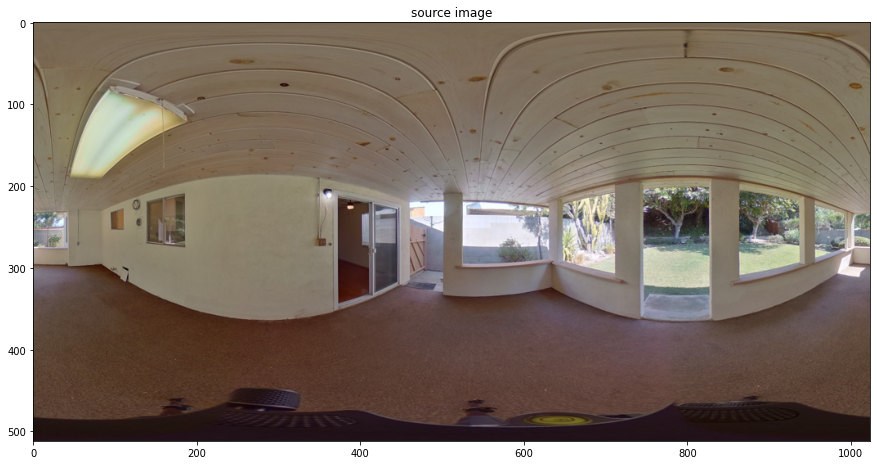

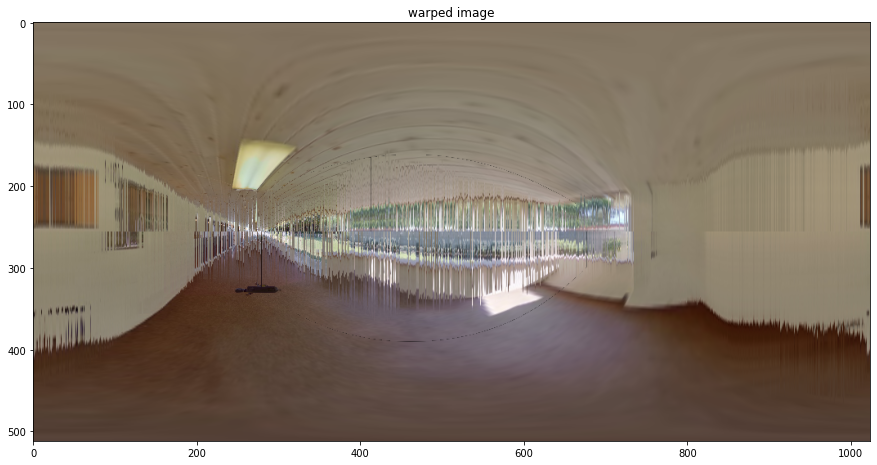

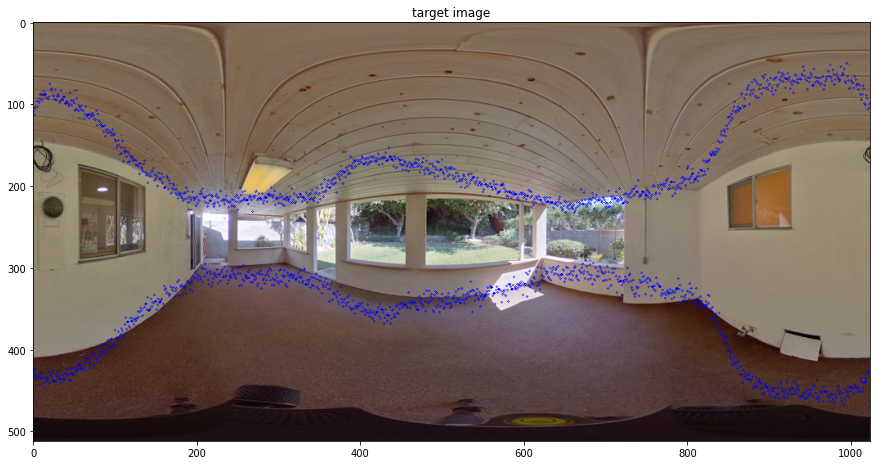

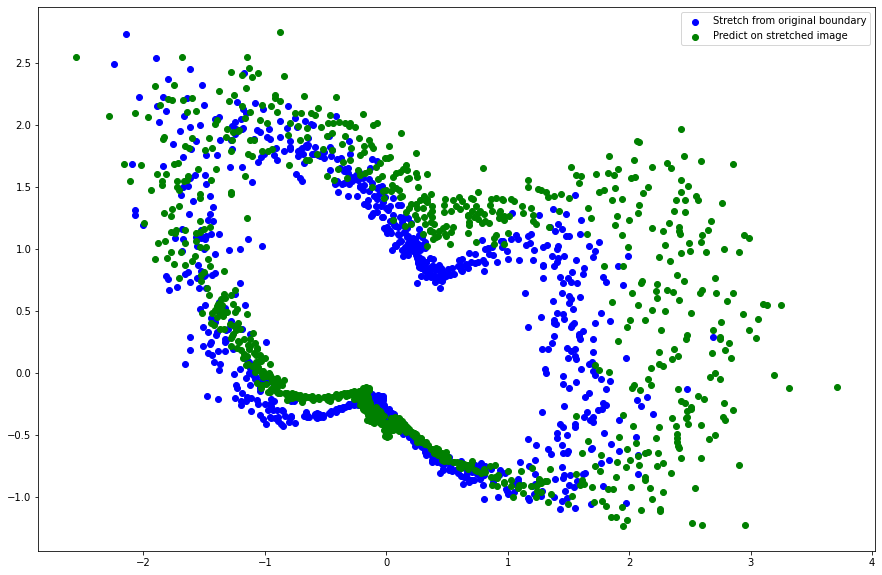

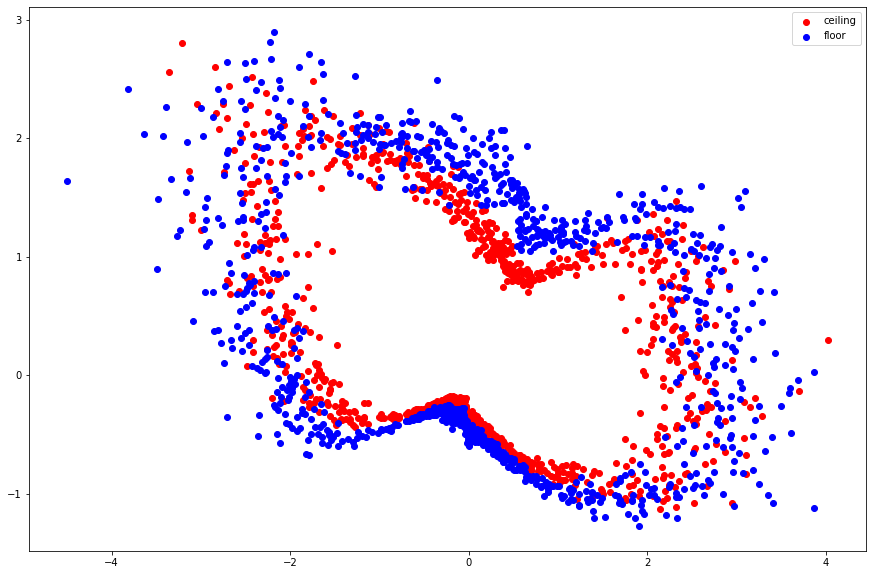

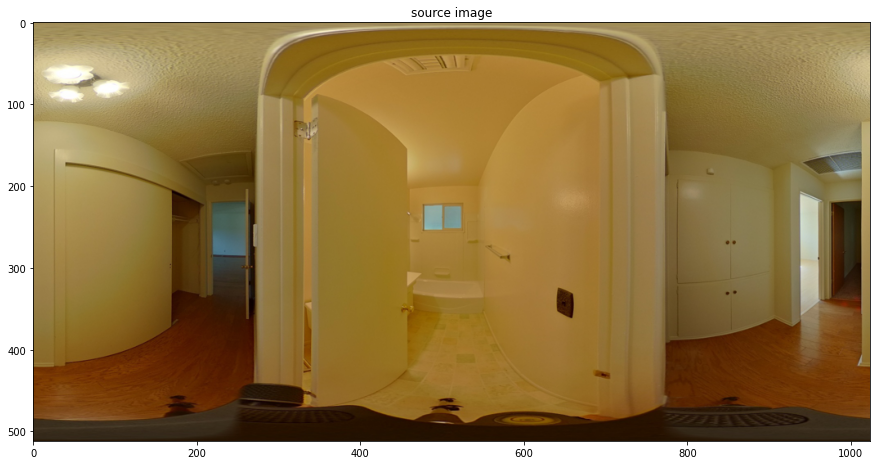

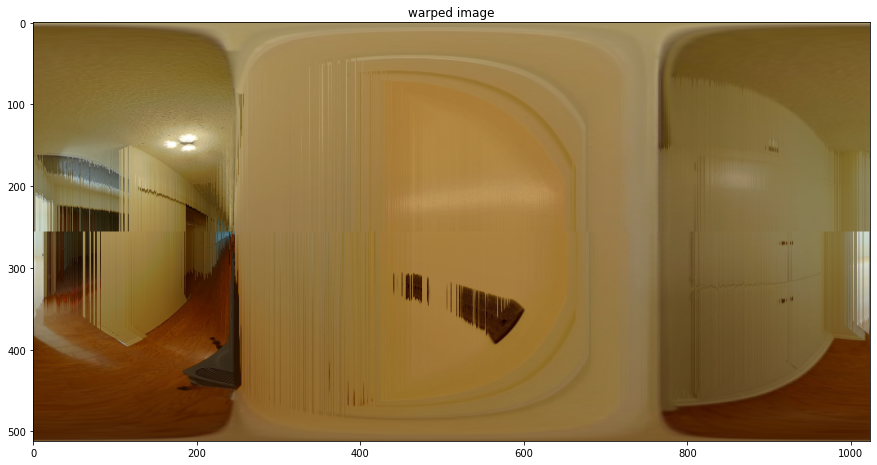

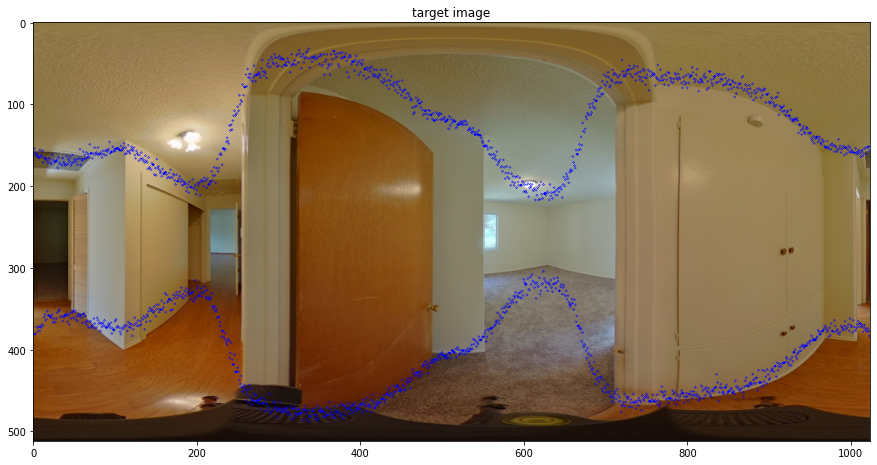

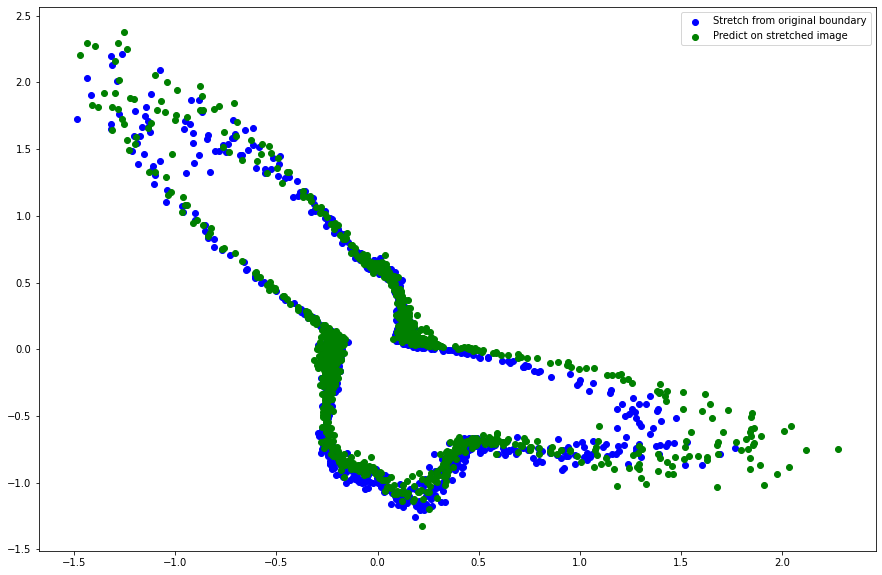

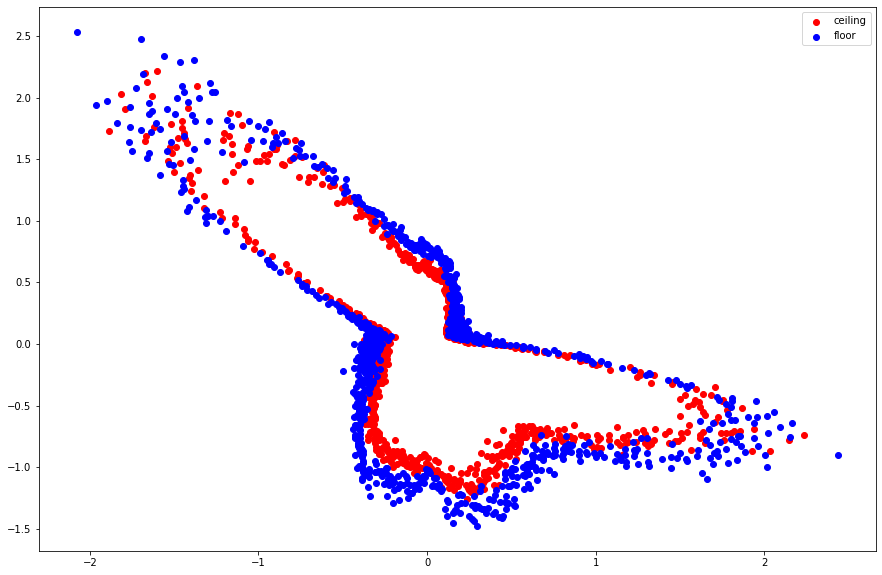

In [13]:
losses = feed_forward(original, criterion, params)

# Active Select

In [4]:
mp3d_dataset = PanoCorBonDataset(
        root_dir='/mnt/home_6T/sunset/mp3d_layout/train_no_occ', return_path=True)
# loader = DataLoader(dataset, )
# it = iter(loader)

net = HorizonNet('resnet50', True)
net.load_state_dict(torch.load('./ckpt/test_on_mp3d_best/best.pth')['state_dict'])

criterion = criterion = torch.nn.MSELoss()

In [42]:
def calc_score(net, x, criterion):
    
    N, C, H, W = x.shape
    y_bon_ori = net(x)
    y_bon = (y_bon_ori / 2 + 0.5) * H - 0.5
    # y_bon = clip_bon(y_bon, H)
    ceiling_z = guess_ceiling(y_bon, H, W)
    target_local_2d = compute_local(y_bon, H, W, ceiling_z[None])
    
    kernel_size = 15
    unfold = nn.Unfold(kernel_size=(1, kernel_size))
    windows = unfold(target_local_2d.reshape(N, 2, W, 2).permute(0, 1, 3, 2)).reshape(N, 2, 2, -1, kernel_size) #(N, C, XY, L, K)
    windows_mean = windows.median(dim=-1, keepdim=True).values
    windows_slope = windows / windows.norm(dim=2, keepdim=True)
    
    manhattan = torch.abs((windows - windows_mean) * torch.flip(windows_slope, [2])).mean(dim=4).min(dim=2).values.mean()
    
    ceil = target_local_2d[:, :1024, :]
    floor = target_local_2d[:, 1024:, :]
    ceil_floor = criterion(ceil, floor)    
    
    
    # draw = True
    draw = False
    if draw:
        target_local_2d = target_local_2d.cpu().detach().numpy()
        plt.figure(figsize=(15,10))
        plt.scatter(target_local_2d[0, :1024, 0], target_local_2d[0, :1024, 1],c="red")
        plt.scatter(target_local_2d[0, :1024, 0], target_local_2d[0, 1024:, 1],c="blue")
    
    return manhattan + ceil_floor

# if False:
if True:
    i = np.random.randint(len(mp3d_dataset))   
    print(i)
    x, _, _, path = mp3d_dataset[i]
    x = x.to('cuda')
    score = calc_score(net, x[None], criterion)
    print(score)

1558
tensor(0.0164, device='cuda:0', grad_fn=<AddBackward0>)


In [49]:
fileids = []
scores = []
net = net.to('cuda')
for jth in trange(len(mp3d_dataset)):
    x, _, _, path = mp3d_dataset[jth]
    fileid = os.path.basename(path)[:-4]
    x = x[None]
    x = x.to('cuda')
    with torch.no_grad():
        score = calc_score(net, x, criterion)
        fileids.append(fileid)
        scores.append(score.item())


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1650/1650 [01:54<00:00, 14.44it/s]


In [52]:
scores = np.array(scores)
# argsort = np.argsort(scores)
sorted_scores = np.sort(scores)[::-1]

th_50 = sorted_scores[49]
th_100 = sorted_scores[99]
th_200 = sorted_scores[199]
th_400 = sorted_scores[399]
# th_1650 = sorted_scores[1650]

seq_50 = (scores >= th_50).astype(int)
seq_100 = (scores >= th_100).astype(int)
seq_200 = (scores >= th_200).astype(int)
seq_400 = (scores >= th_400).astype(int)
seq_1650 = np.ones(1650)

df = pd.DataFrame({
    'fileid': fileids,
    '50': seq_50,
    '100': seq_100,
    '200': seq_200,
    '400': seq_400
})
df.to_csv('active_select_splits.csv', index=None)

In [9]:
ss360_df = pd.read_csv('matterport_train_splits.csv')
ss360_seq_50 = np.array(ss360_df['50'])
ss360_seq_100 = np.array(ss360_df['100'])
ss360_seq_200 = np.array(ss360_df['200'])
ss360_seq_400 = np.array(ss360_df['400'])

In [47]:
(ss360_seq_50 != seq_50).sum(), (ss360_seq_100 != seq_100).sum(), (ss360_seq_200 != seq_200).sum(), (ss360_seq_400 != seq_400).sum()

(100, 190, 352, 590)

In [51]:
(ss360_seq_50 * seq_50).sum(), (ss360_seq_100 * seq_100).sum(), (ss360_seq_200 * seq_200).sum(), (ss360_seq_400 * seq_400).sum()

(1, 3, 30, 103)

In [184]:
seq_50.sum(), seq_100.sum(),seq_200.sum(),seq_400.sum()

(50, 100, 200, 400)

In [70]:
x, _, _, path = dataset[0]
y_bon_ori = net(x[None])
y_bon = (y_bon_ori / 2 + 0.5) * H - 0.5
# y_bon = clip_bon(y_bon, H)
C, H, W = x.shape
guess_ceiling(y_bon, H, W)

tensor([0.6466], grad_fn=<MeanBackward1>)

# Trash

In [25]:
(-0.478/np.pi + 0.5) * 512, (0.425/np.pi + 0.5) * 512

(178.0981116949238, 325.26423123359285)

In [13]:
def guess_ceiling(y_bon, H, W):
    local_2d = compute_local(y_bon, H, W, torch.ones(2, 1)) # (N, 2*1024, 2)
    ceil_2d = local_2d[:, :W, :]
    floor_2d = local_2d[:, W:, :]
    
    ceil_dist = torch.norm(ceil_2d, dim=-1)
    floor_dist = torch.norm(floor_2d, dim=-1)
    
    scale = (floor_dist / ceil_dist)
    print(scale.var(dim=-1))
    
    # print(ceil_dist, floor_dist, scale)
    
    ceil_2d = ceil_2d.detach()
    floor_2d = floor_2d.detach()
    
    for i in range(2):
        plt.figure(figsize=(15,10))
        plt.scatter(ceil_2d[i, :, 0], ceil_2d[i, :, 1], c="red", label='ceiling')
        plt.scatter(floor_2d[i, :, 0], floor_2d[i, :, 1], c="blue", label='floor')
        plt.legend()
    
    return scale.mean(dim=-1) 

torch.Size([2, 1])
tensor(-0.0235, grad_fn=<MeanBackward0>)


{'ph': tensor(0.0284, grad_fn=<MseLossBackward>),
 'bon': tensor(0.0007, grad_fn=<MseLossBackward>),
 'parallel': tensor(0.0003, grad_fn=<MeanBackward0>),
 'stretch': tensor(0.0745, grad_fn=<AddBackward0>),
 'total': tensor(0.0286, grad_fn=<AddBackward0>)}

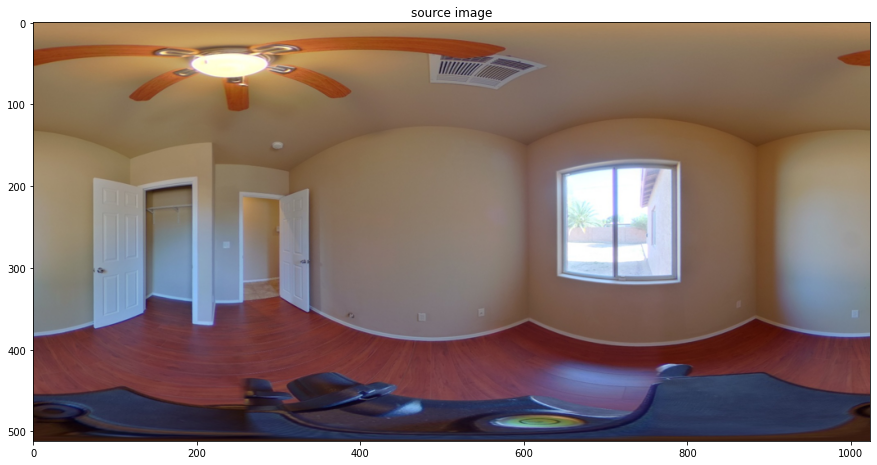

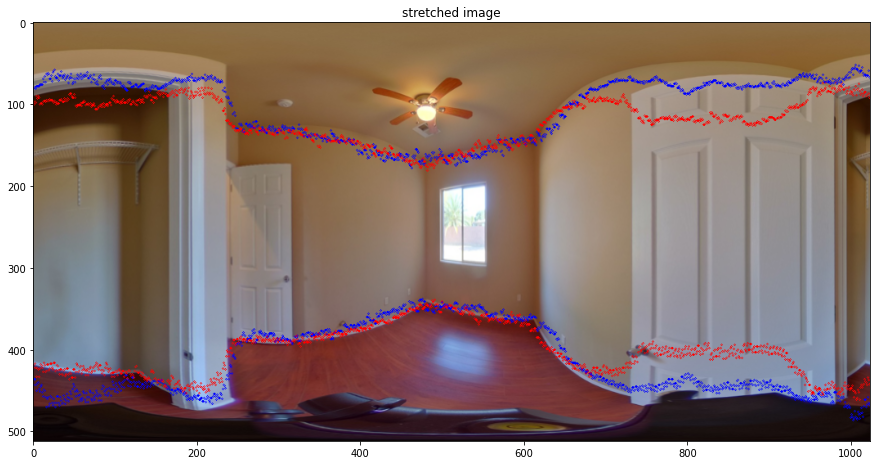

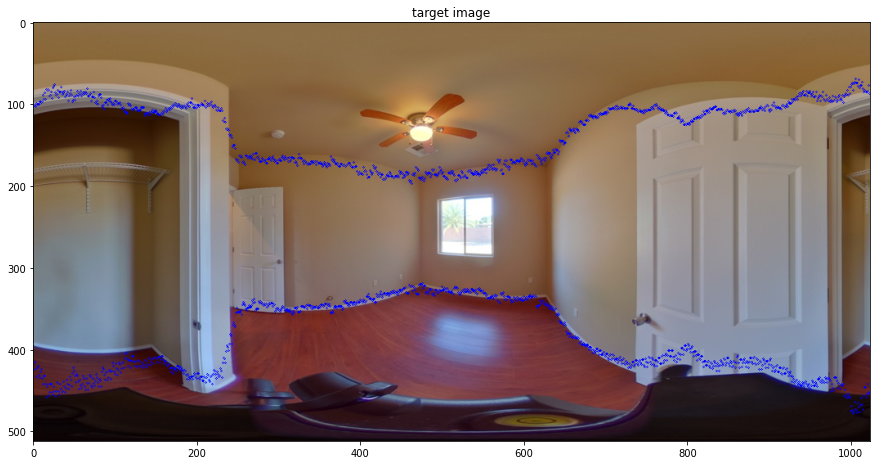

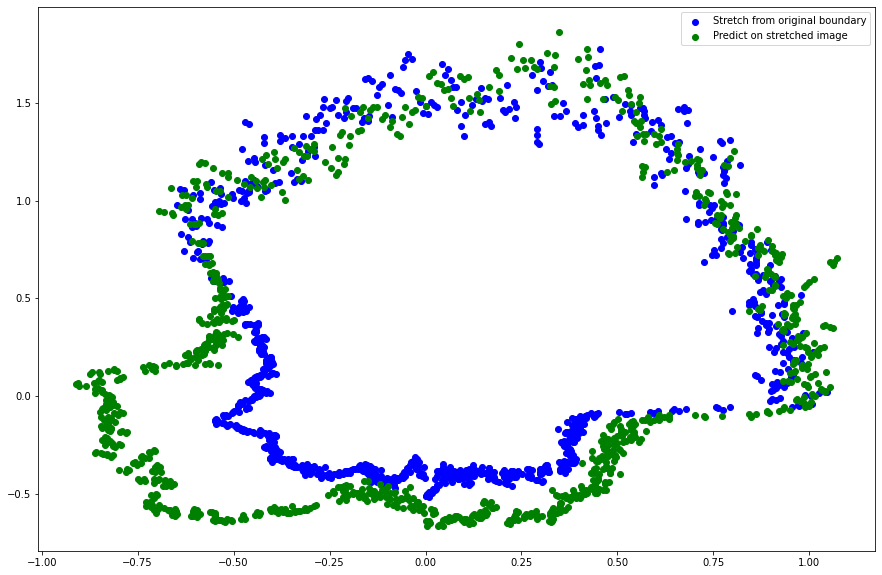

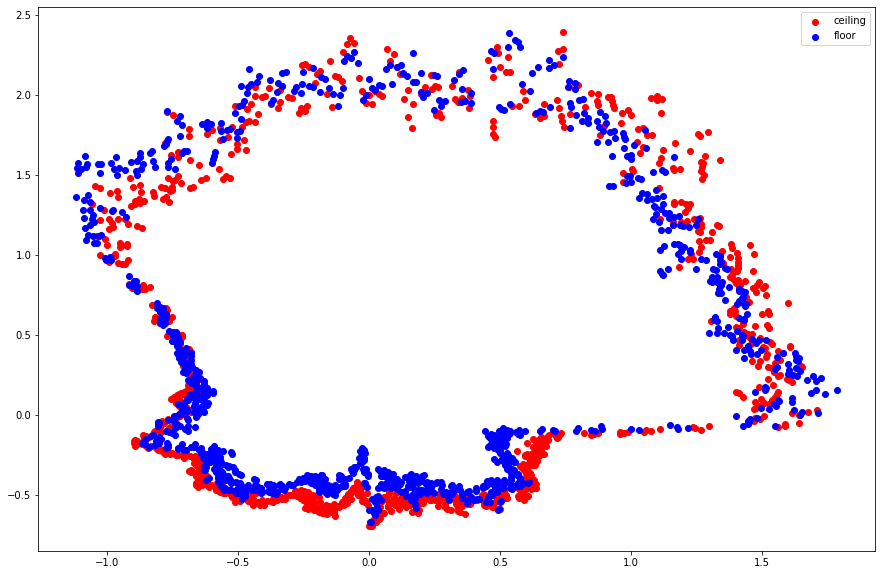

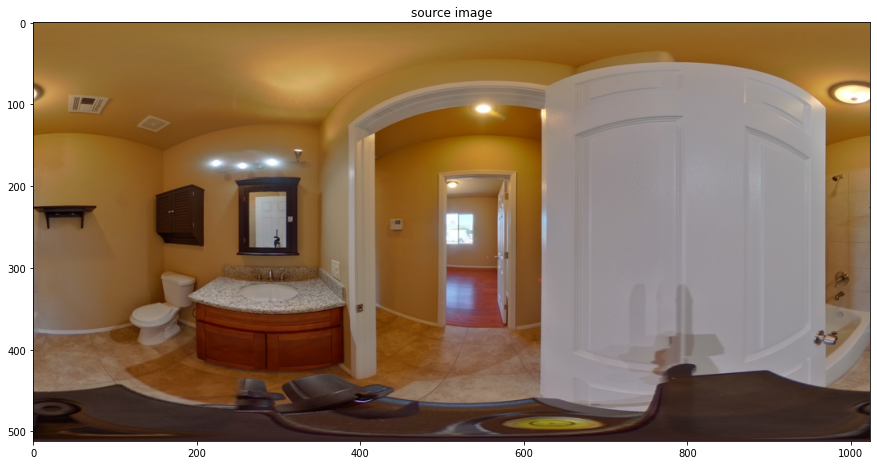

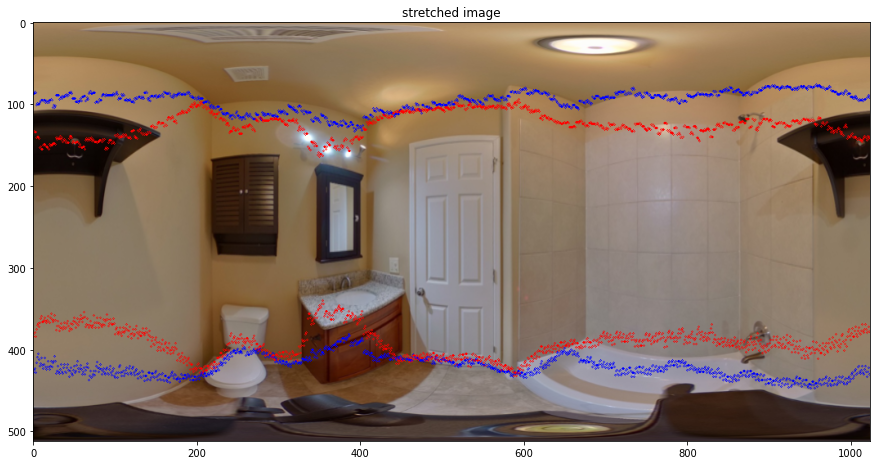

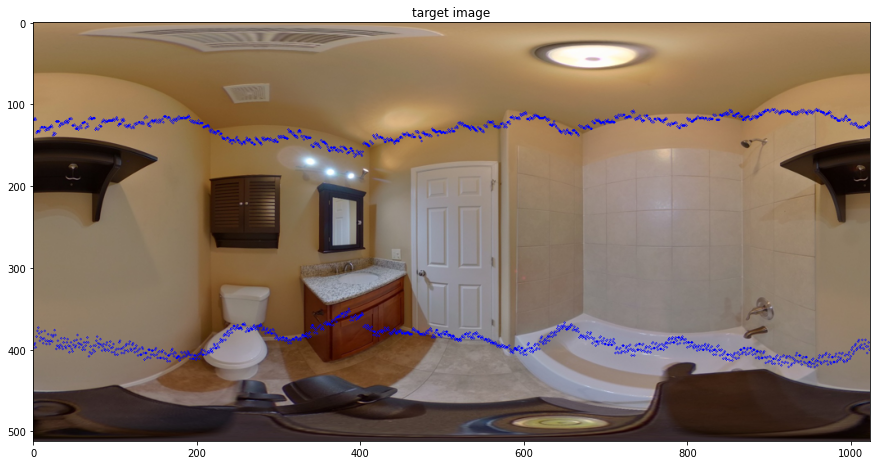

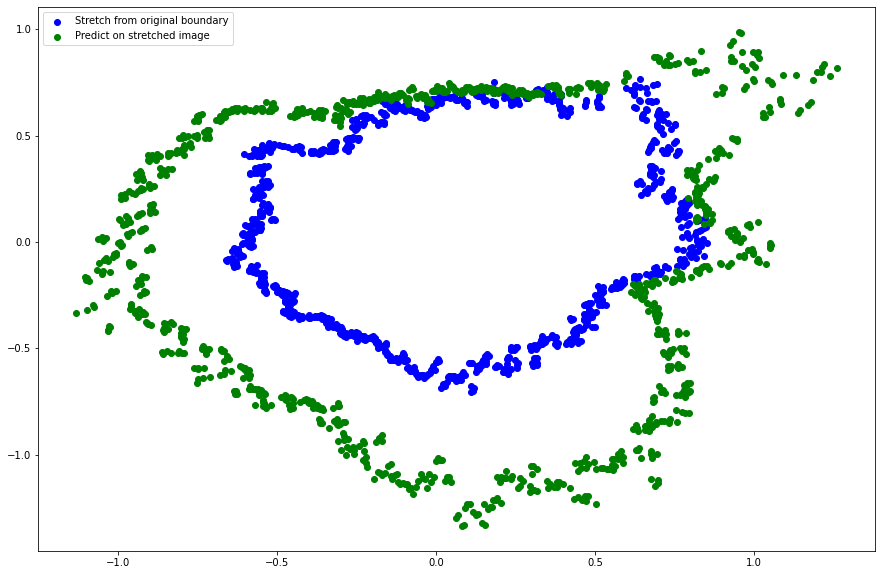

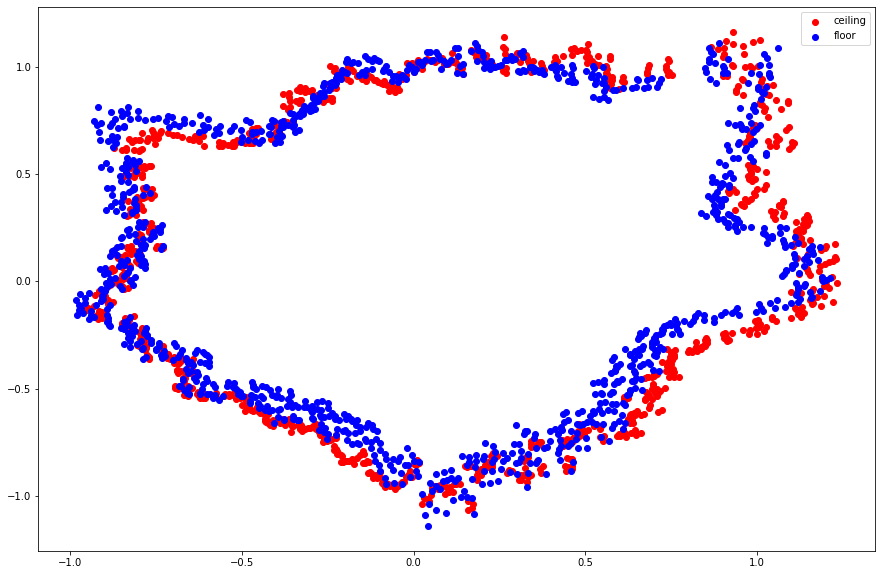

In [8]:
feed_forward(original, criterion, params)

In [6]:
for _ in range(15):
    params = next(it)

In [9]:
losses['stretch']

tensor(0.0194, grad_fn=<AddBackward0>)

In [ ]:
for p in net.parameters():
    print(p.grad)

In [23]:
stretch_k

tensor([[0.9613, 1.2482],
        [0.7350, 1.5216]])

In [17]:
8192 / (2*2*1024)

2.0

In [14]:
(target_img - target_img).sum()

tensor(0.)

In [22]:
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, stretched_src_img, stretched_target_img, stretch_k, ceiling_height = params

In [12]:
ceiling_height.shape

torch.Size([2, 1])

In [450]:
bon = torch.ones(2, 2, 1024) * 255
bon = clip_bon(bon, H)
bon.requires_grad_()

tensor([[[211., 211., 211.,  ..., 211., 211., 211.],
         [301., 301., 301.,  ..., 301., 301., 301.]],

        [[211., 211., 211.,  ..., 211., 211., 211.],
         [301., 301., 301.,  ..., 301., 301., 301.]]], requires_grad=True)

In [442]:
src_transformer = Transformation2D(rotation_matrix=src_rotation_matrix, scale=src_scale[:, :, None], translation=src_translation)
target_transformer = Transformation2D(rotation_matrix=target_rotation_matrix, scale=target_scale[:, :, None], translation=target_translation)
ceiling_z = ceiling_height - 1.

grid = warp_index(src_transformer, target_transformer, bon, 512, 1024, ceiling_z)
warp_img = F.grid_sample(src_img, grid)
loss = criterion(warp_img, target_img)
loss.backward()

In [444]:
bon.grad.max()

tensor(3.3852e-06)

In [ ]:
phi = (0.5 - (torch.arange(512) / 512)) * np.pi
torch.min(1 / torch.tan(phi), torch.ones(512)*3)

In [433]:
src_rotation_matrix.shape

torch.Size([2, 2, 2])

In [12]:
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, ceiling_height = params
# target_translation

In [449]:
def nan_to_num(x):
    nan_map = x.isnan()
    res = nan_map.float() #(N, 2, 1024)
    res[:, 0, :] *= -0.478
    res[:, 1, :] *= 0.425

    x[nan_map] = 0.

    return x + res 

def clip_bon(bon, H):
    # bon.shape = (N, 2, 1024)
    ceil = torch.clamp(bon[:, 0, :], 0.5, H/2 - 45)
    floor = torch.clamp(bon[:, 1, :], H/2 + 45, H - 0.5)

    return torch.stack((ceil, floor), dim=1)

In [50]:
x = torch.randn(2, 2, 10)
x[0, 0, 8] = float('Nan')
x[1, 1, 5] = float('Nan')
x

tensor([[[ 0.8923,  0.3190,  0.7006,  0.7953,  0.8317,  0.9812, -0.2196,
          -0.6014,     nan, -0.9470],
         [ 0.8430,  1.1502,  0.2082,  0.0361, -0.9370, -0.0347, -0.3157,
           1.3164,  1.5908, -1.3766]],

        [[-1.2661, -0.5336, -0.0464, -0.4661,  0.4657, -0.2960,  0.8790,
           0.4888, -0.5081,  0.2253],
         [ 0.4330, -0.5401,  0.7036,  0.9548, -1.0742,     nan,  0.6938,
          -0.2165,  0.4911, -0.1423]]])

In [51]:
nan_to_num(x)

tensor([[[ 0.8923,  0.3190,  0.7006,  0.7953,  0.8317,  0.9812, -0.2196,
          -0.6014, -0.4780, -0.9470],
         [ 0.8430,  1.1502,  0.2082,  0.0361, -0.9370, -0.0347, -0.3157,
           1.3164,  1.5908, -1.3766]],

        [[-1.2661, -0.5336, -0.0464, -0.4661,  0.4657, -0.2960,  0.8790,
           0.4888, -0.5081,  0.2253],
         [ 0.4330, -0.5401,  0.7036,  0.9548, -1.0742,  0.4250,  0.6938,
          -0.2165,  0.4911, -0.1423]]])

In [32]:
torch.stack((torch.randn(10), torch.randn(10)), dim=-1).shape

torch.Size([10, 2])

In [37]:
a = torch.Tensor([2.])
b = torch.Tensor([1.])
torch.asin(b/a)

tensor([0.5236])

In [43]:
a = torch.Tensor([float('NaN'), 0.5])
a * torch.logical_not(a.isnan())

tensor([   nan, 0.5000])

In [20]:
0.478 * 2 / np.pi

0.3043042511917039

In [16]:
0.425 * 2 / np.pi

0.2705634032562221

In [19]:
y = 0.425 * 2 / np.pi
nn.Sigmoid()(torch.Tensor([y]))

tensor([0.5672])

In [116]:
src_global_2d.reshape(2, 2, 1024, 2).permute(0, 1, 3, 2).reshape(2, 4, 1, 1024).shape

torch.Size([2, 4, 1, 1024])

In [219]:
unfold = nn.Unfold(kernel_size=(1, 15))
windows = unfold(src_global_2d.reshape(2, 2, 1024, 2).permute(0, 1, 3, 2)).reshape(2, 2, 2, 15, -1) #(N, C, XY, K, L)
windows.var(dim=3).min(dim=2).values.mean()

tensor(1.4897)

In [196]:
a = torch.arange(10).expand(1, 2, 1, 10).float()
a[:, 1, :, :] += 10
unfold = nn.Unfold(kernel_size=(1, 5))
unfold(a).reshape(1, 2, 5, 6).permute(0, 1, 3, 2)[0]

tensor([[[ 0.,  1.,  2.,  3.,  4.],
         [ 1.,  2.,  3.,  4.,  5.],
         [ 2.,  3.,  4.,  5.,  6.],
         [ 3.,  4.,  5.,  6.,  7.],
         [ 4.,  5.,  6.,  7.,  8.],
         [ 5.,  6.,  7.,  8.,  9.]],

        [[10., 11., 12., 13., 14.],
         [11., 12., 13., 14., 15.],
         [12., 13., 14., 15., 16.],
         [13., 14., 15., 16., 17.],
         [14., 15., 16., 17., 18.],
         [15., 16., 17., 18., 19.]]])

In [140]:
a

tensor([[[[ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9.]],

         [[10., 11., 12., 13., 14., 15., 16., 17., 18., 19.]]]])

In [119]:
for p in net.parameters():
    if p.grad is not None:
        print(p.grad)

In [ ]:
loss = losses['total']
loss.backward()

In [41]:
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, ceiling_height = params

In [ ]:
src_scale[:, :, None].shape

In [ ]:
device = 'cpu'

In [ ]:
params = next(it)
# criterion = torch.nn.MSELoss()
warp_img = feed_forward(net, criterion, params)

In [ ]:
rescale_grid = (grid[0] / 2 + 0.5).detach().numpy()
rescale_grid[:, :, 0] *= 1024
rescale_grid[:, :, 1] *= 512
src_img, src_rotation_matrix, src_scale, src_translation, target_img, target_rotation_matrix, target_scale, target_translation, ceiling_height = params

col = 700
target_img = target_img[0].detach().numpy().transpose(1, 2, 0).copy()
src_img = src_img[0].detach().numpy().transpose(1, 2, 0).copy()
radius = 1
color = (0, 0, 255)
thickness = 1
for i, (src_x, src_y) in enumerate(rescale_grid[:, col, :].astype(int)):
    target_x, target_y = col, i
    
    coord = (target_x, target_y)
    cv2.circle(target_img, coord, radius, color, thickness)
    
    coord = (src_x, src_y)
    cv2.circle(src_img, coord, radius, color, thickness)
    
plt.figure(figsize=(15,10))
plt.title('source image')
plt.imshow(src_img)
# plt.figure(figsize=(15,10))
# plt.title('warped image')
# plt.imshow(warp_img.detach().permute(1, 2, 0))
plt.figure(figsize=(15,10))
plt.title('target image')
plt.imshow(target_img)

In [ ]:
torch.randn(1, 512*1024, 2).bmm(torch.randn(1, 2, 2)).shape

In [31]:
np.stack([np.arange(5), np.random.rand(5)], 1).shape

(5, 2)

0.34784787440414805

In [56]:
y = 0.425 + 0.5
np.log(y / (1 - y))

2.5123056239761157

In [43]:
src.scale.shape

NameError: name 'src' is not defined

In [113]:
1 / torch.tan(0.5 - torch.Tensor([400])/512)

tensor([-3.4613])

In [123]:
a = torch.randn(2, 5)
a.requires_grad_()
a.grad

In [124]:
b = torch.var(a)
b.backward()
a.grad

tensor([[-0.0938,  0.0439,  0.1147,  0.0851, -0.0597],
        [-0.1303,  0.2596, -0.4339,  0.2189, -0.0044]])

In [128]:
kernel_size = 15
mean = (kernel_size - 1) / 2
sigma = 3
variance = sigma ** 2.

x = torch.arange(kernel_size).float()
gaussian_kernel = torch.exp(- (x - mean) ** 2. / (2 * variance))
gaussian_kernel /= torch.sum(gaussian_kernel)

In [131]:
gaussian_kernel

tensor([0.0088, 0.0182, 0.0336, 0.0553, 0.0816, 0.1078, 0.1273, 0.1346, 0.1273,
        0.1078, 0.0816, 0.0553, 0.0336, 0.0182, 0.0088])

In [110]:
y_bon

tensor([[[137.8351, 139.4078, 168.2530,  ..., 136.4768, 159.6369, 164.9566],
         [408.5117, 372.8072, 370.5755,  ..., 349.3859, 347.9473, 359.5781]],

        [[158.5690, 174.3659, 165.4908,  ..., 172.1015, 159.6303, 165.9515],
         [338.0992, 313.3039, 332.3700,  ..., 326.2712, 324.9356, 336.3463]]],
       grad_fn=<ClampBackward>)

In [60]:
a = 0.5 - torch.Tensor([255.5]) / 256
1 / torch.tan(a)

tensor([-1.8390])

In [53]:
img = torch.randn(1, 3, 256, 256)
grid = torch.randn(1, 256, 256, 2)

In [58]:
F.grid_sample(img, grid).isnan().sum()

tensor(0)

# Tutor

In [88]:
def fib(n, a=1, b=1):
    if n==0:
        yield a
    else:
        yield a
        yield from fib(n-1, b, a+b) 

In [87]:
list(fib(5))

[0, 1, 1, 2, 3, 5]

In [60]:
for i in range(10):
    print(fib(i))

1
1
2
3
5
8
13
21
34
55


In [217]:
class Queen:
    def __init__(self, n):
        self.size = n
        self.reset()
        
    def reset(self):
        self.solution = []
        self.board = [-1] * self.size
    
    def solve(self):        
        if -1 not in self.board:
            yield self.board[:]
        
        else:
            row = self.board.index(-1)
            for col in range(self.size):
                if self.valid(row, col):
                    self.board[row] = col
                    yield from self.solve()
                    self.board[row] = -1
        
        
    def valid(self, place_row, place_col):
        for row in range(place_row):
            col = self.board[row]
            if place_col==col or abs(place_col - col)==abs(place_row - row):
                return False
        return True
        
    def get_solutions(self):
        return self.solution
        
problem = Queen(8)
len(list(problem.solve()))

92

In [50]:
def reverse(x, start=0, end=):
    if len(x)==1:
        return
    mid = (len(x)+1) // 2
    reverse(x[:mid])
    reverse(x[mid:])
    x[mid:], x[:mid] = x[:mid], x[mid:]
x = list(range(8))
reverse(x)
x

[4, 5, 6, 7, 0, 1, 2, 3]

In [47]:
def add(x):
    x[0] += 1
add(x)
x

[1, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [172]:
def hanoi(n, A="A", B="B", C="C"):
    if n > 0:
        hanoi(n-1, A, C, B)
        print(f"Move a Disc from {A} to {C}")
        hanoi(n-1, B, A, C)

In [173]:
hanoi(3)

Move a Disc from A to C
Move a Disc from A to B
Move a Disc from C to B
Move a Disc from A to C
Move a Disc from B to A
Move a Disc from B to C
Move a Disc from A to C


In [10]:
a = ['A', 'B']
list(itertools.permutations(a, 2))

[('A', 'B'), ('B', 'A')]

In [12]:
class User:
    def __init__(self):
        pass
    @property
    def password(self):
        return 'Not readable attribute'
    @password.setter
    def password(self, val):
        self._password = val
        
a = User()
a.password = '1234'
a.password

'Not readable attribute'

In [10]:
sys.argv

['/home/joshua049/anaconda3/envs/pytorch3d/lib/python3.8/site-packages/ipykernel_launcher.py',
 '-f',
 '/home/joshua049/.local/share/jupyter/runtime/kernel-925a4c53-0c4b-4be4-8b16-f18205b15430.json']

In [13]:
a = np.array([1, 2])
b = np.array([2, 5])
np.multiply(a, b)

array([ 2, 10])

In [55]:
a = torch.autograd.Variable(torch.randn(3,3), requires_grad=True)
b = torch.autograd.Variable(torch.randn(3,3), requires_grad=True)
c = (a ** b)
c.mean().backward()
a, a.grad

(tensor([[ 0.1122, -0.4525,  1.4165],
         [-0.2155,  0.7286, -1.0352],
         [-0.6477, -0.4116, -0.0967]], requires_grad=True),
 tensor([[0.1659,    nan, 0.7709],
         [   nan, 0.0574,    nan],
         [   nan,    nan,    nan]]))

In [53]:
a, b, c

(tensor([[ 0.9752, -0.8139,  1.0650],
         [ 0.2186,  0.5022,  0.1343],
         [ 0.4523, -0.4355, -0.5570]], requires_grad=True),
 tensor([[ 0.1621, -0.1163, -0.1921],
         [ 0.5514,  1.5709,  2.7692],
         [-2.2628, -0.0425, -0.0092]], requires_grad=True),
 tensor([[9.9593e-01,        nan, 9.8798e-01],
         [4.3237e-01, 3.3896e-01, 3.8525e-03],
         [6.0204e+00,        nan,        nan]], grad_fn=<PowBackward1>))

In [54]:
b.grad

tensor([[-0.0028,     nan,  0.0069],
        [-0.0731, -0.0259, -0.0009],
        [-0.5307,     nan,     nan]])